In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import networkx as nx
import astropy
from astropy.io import fits
from astropy import units as u
from astropy.constants import c
from astropy.coordinates import SkyCoord
from astropy.cosmology import WMAP9 as cosmo
from mpl_toolkits.axes_grid1 import make_axes_locatable
from sklearn.decomposition import PCA
import time

In [2]:
data = fits.open("hlsp_jades_jwst_nircam_goods-s-deep_photometry_v2.0_catalog.fits")

In [3]:
all_zs = data[9].data['EAZY_z_a']
ras = data[7].data['ra'][~np.isnan(all_zs)]
decs = data[7].data['dec'][~np.isnan(all_zs)]
zs = all_zs[~np.isnan(all_zs)]


Use 
$$
z \approx \frac{H_0 D}{c}
$$

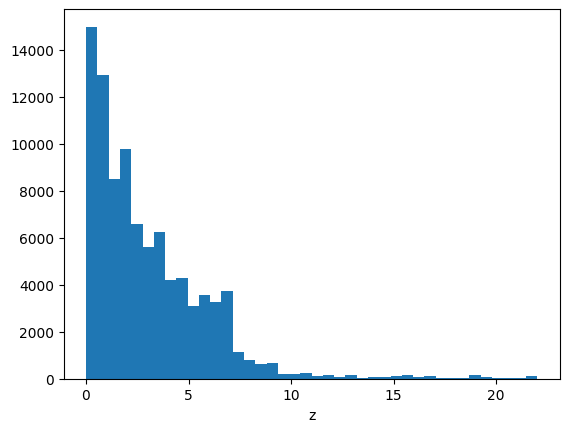

In [28]:
plt.hist(zs, bins=40)
plt.xlabel("z")
plt.show()

In [29]:
sum(zs < 0.03), sum((zs > 8) & (zs < 9))

(1198, 1122)

In [30]:
def get_dist(z):
    H0 = cosmo.H(0)
    D = c * z / H0
    return D

In [31]:
get_dist(zs[0])

<Quantity 3719294.77611079 m Mpc / km>

In [32]:
def get_distances(mask):
    num_galaxies = sum(mask)
    coordinates = SkyCoord(ra=ras*u.deg, dec=decs*u.deg, distance=get_dist(zs))[mask]
    distance_matrix = np.zeros((num_galaxies, num_galaxies))

    start = time.time()
    for i in range(num_galaxies):
        # print(i, coordinates[i])
        # print(coordinates[i].get_constellation())
        for j in range(num_galaxies):
            distance_matrix[i][j] = coordinates[i].separation_3d(coordinates[j]).to(u.Mpc).value
    print("Time:", time.time() - start)
    return distance_matrix

In [33]:
close_mask = (zs < 0.03)
far_mask = (zs > 8) & (zs < 9)

In [34]:
close_distance_matrix = get_distances(close_mask)

Time: 613.2055191993713


In [35]:
far_distance_matrix = get_distances(far_mask)

Time: 543.5803530216217


In [45]:
np.savez("close_far_distance_matrices.npz", close=close_distance_matrix, far=far_distance_matrix)

(array([1435204.,       0.,       0.,       0.,       0.,       0.,
              0.,       0.,       0.,       0.]),
 array([   0.        ,  424.01181231,  848.02362461, 1272.03543692,
        1696.04724922, 2120.05906153, 2544.07087384, 2968.08268614,
        3392.09449845, 3816.10631076, 4240.11812306]),
 <BarContainer object of 10 artists>)

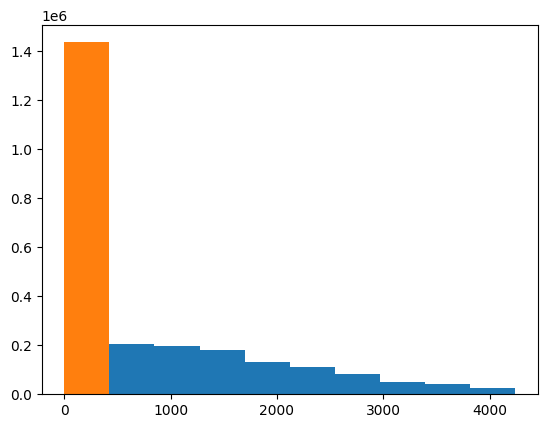

In [41]:
_, bins, _ = plt.hist(far_distance_matrix.flatten())
plt.hist(close_distance_matrix.flatten(), bins=bins)


In [55]:
close_distance_matrix.flatten()

array([0.00000000e+00, 4.32476138e+01, 2.79757743e-02, ...,
       3.60603704e-02, 1.68950766e-03, 0.00000000e+00])

In [59]:
np.percentile(close_distance_matrix.flatten(), 50), np.percentile(far_distance_matrix.flatten(), 50)

(0.06908336371566094, 1257.3991217960443)

(0.0, 0.4)

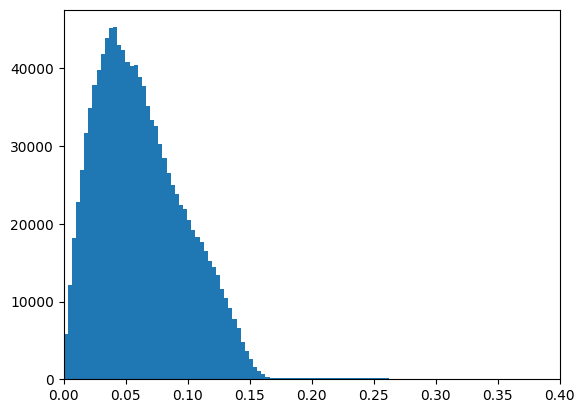

In [57]:
plt.hist(close_distance_matrix[close_distance_matrix<5].flatten(), bins=100)
plt.xlim(0,.4)

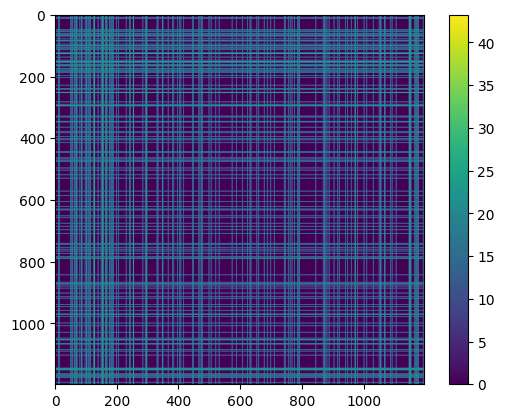

In [43]:
plt.imshow(close_distance_matrix)
plt.colorbar()

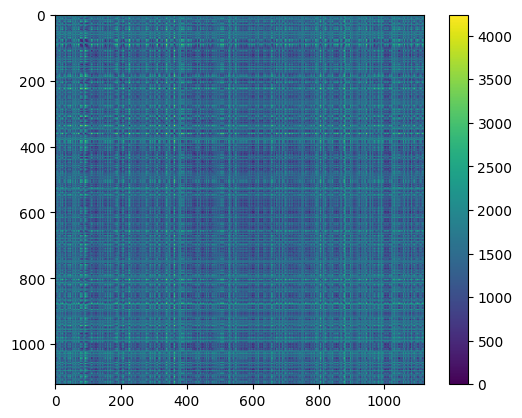

In [44]:
plt.imshow(far_distance_matrix)
plt.colorbar()

In [46]:
def get_node_edge_list(distance_matrix, distance_cutoff, filename=None):
    adj_matrix = (distance_matrix < distance_cutoff)
    
    num_galaxies = distance_matrix.shape[0]
    nodes_list = np.arange(num_galaxies)
    
    edge_list = []
    for i in range(num_galaxies):
        for j in range(i):
            if adj_matrix[i][j]:
                edge_list.append((i,j))
    print("# edges", len(edge_list))
    if filename is not None:
        np.savetxt(filename, edge_list, fmt='%d')
    return edge_list
    

In [60]:
close_edge_list = get_node_edge_list(close_distance_matrix, distance_cutoff=5000, filename="close_5000_edgelist.txt")
far_edge_list = get_node_edge_list(far_distance_matrix, distance_cutoff=5000, filename="far_5000_edgelist.txt")

# edges 717003
# edges 628881


In [61]:
close_edge_list50 = get_node_edge_list(close_distance_matrix, distance_cutoff=np.percentile(close_distance_matrix.flatten(), 50), 
                                       filename="close_50_edgelist.txt")
far_edge_list50 = get_node_edge_list(far_distance_matrix, distance_cutoff=np.percentile(far_distance_matrix.flatten(), 50),
                                     filename="far_50_edgelist.txt")

# edges 358202
# edges 314160


In [179]:
# nodes_list = np.arange(num_galaxies)
# disconnected_nodes = np.where(np.sum(adj_matrix, axis=0) == 1)[0]
# # print(disconnected_nodes)
# nodes_list = np.delete(nodes_list, disconnected_nodes)
               

In [258]:
G = nx.Graph()
G.add_nodes_from(np.arange(sum(close_mask)))

In [259]:
G.add_edges_from(close_edge_list50)

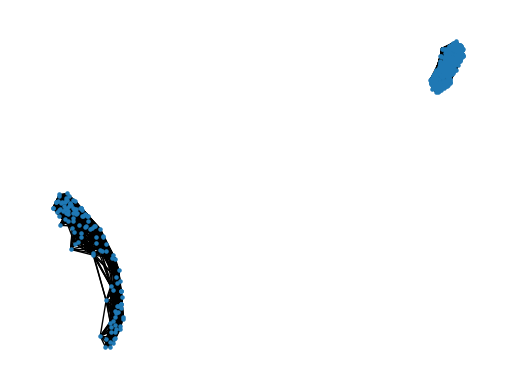

In [260]:
fig, ax = plt.subplots()
nx.draw(G, node_size=5, ax = ax)
# fig.savefig("figures/graph.pdf", bbox_inches='tight')

brb, running struc2vec...

In [269]:
embedding = np.loadtxt('close_50.emb', skiprows=1)
nodes, *x = embedding.T
x = np.array(x)
pca = PCA(n_components=10)
pca_results = pca.fit_transform(x.T)

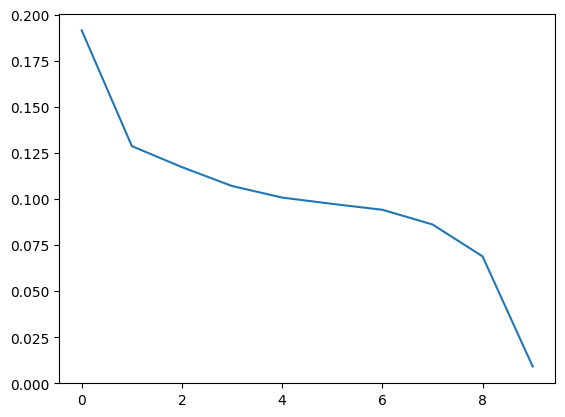

In [270]:
plt.plot(pca.explained_variance_ratio_)

In [271]:
x1 = pca_results[:,0]
x2 = pca_results[:,1]
x3 = pca_results[:,2]

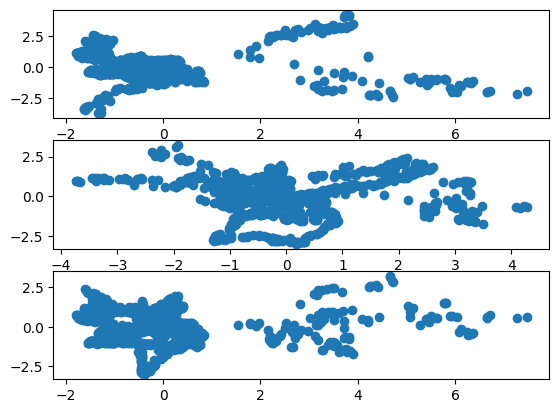

In [272]:
fig, ax = plt.subplots(3,1)
ax[0].plot(x1, x2, 'o')
ax[1].plot(x2, x3, 'o')
ax[2].plot(x1, x3, 'o')

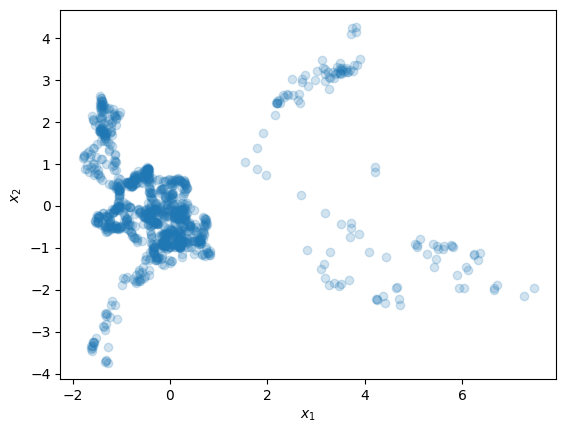

In [273]:
plt.plot(x1, x2, 'o', alpha=0.2)
plt.xlabel("$x_1$")
plt.ylabel("$x_2$")
plt.show()

In [294]:
sum(x1 > 1), sum(x1 < 1)

(124, 1074)

In [274]:
def draw_graph_mask(mask):
    colors = ['b'] * len(nodes)
    colors = np.array(colors)
    colors[mask] = 'r'
    nx.draw(G, node_size=50, node_color=colors)

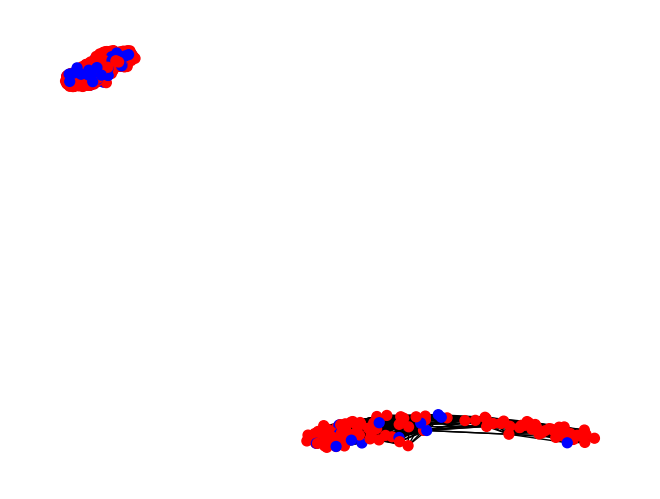

In [275]:
draw_graph_mask(x1 < 1)

In [276]:
def draw_graph_mask(nodes, edges, mask, ax = None):
    colors = ['b'] * len(nodes)
    colors = np.array(colors)
    colors[mask] = 'r'
    G = nx.Graph(edges)
    G.add_nodes_from(nodes)
    G.add_edges_from(edges)
    if ax is not None:
        fig, ax = plt.subplots()
        nx.draw(G, node_size=50, node_color=colors, ax = ax)
    else:
        nx.draw(G, node_size=5, node_color=colors)

In [282]:
max(nodes)

1197.0

In [281]:
np.arange(sum(close_mask))

array([   0,    1,    2, ..., 1195, 1196, 1197])

In [287]:
np.sort(nodes)

array([0.000e+00, 1.000e+00, 2.000e+00, ..., 1.195e+03, 1.196e+03,
       1.197e+03])

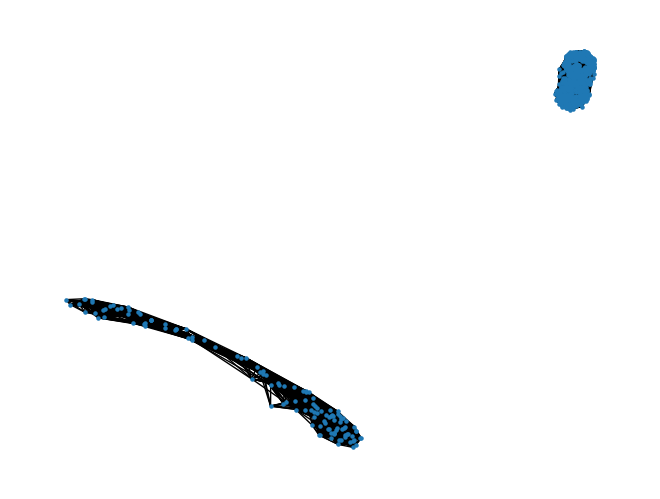

In [284]:
G = nx.Graph(close_edge_list50)
nx.draw(G, node_size=5)

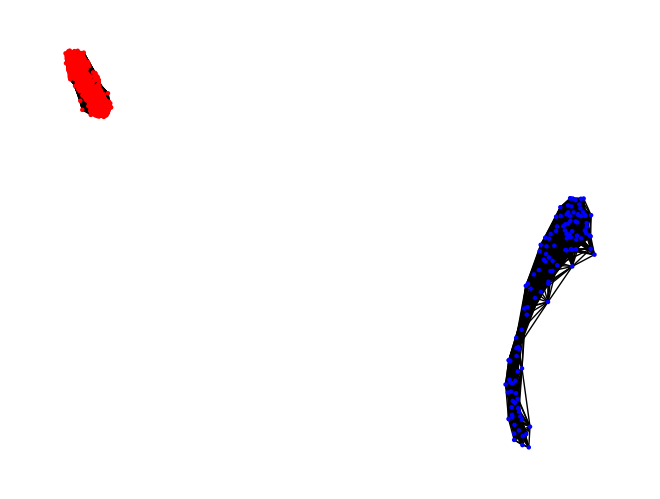

In [292]:
draw_graph_mask(nodes, close_edge_list50, x1 < 1)

In [295]:
nodes_in_clump = [0]
for i, edge_pair in enumerate(np.array(close_edge_list50)):
    if not i % 1000:
        # print(i)
        nodes_in_clump = list(np.unique(nodes_in_clump))
# print(edge_pair)
    if edge_pair[0] in nodes_in_clump:
        # print(node, edge_pair)
        nodes_in_clump.append(edge_pair[1])
    elif edge_pair[1] in nodes_in_clump:
        nodes_in_clump.append(edge_pair[0])
    # print(nodes_in_clump)
nodes_in_clump = np.unique(nodes_in_clump)

In [296]:
nodes_in_other_clump = [i for i in np.arange(1198) if i not in nodes_in_clump]
edges_in_other_clump = np.array([i for i in np.array(close_edge_list50) if i[0] in nodes_in_other_clump])

In [297]:
clump_node_mask = np.array([True if i in nodes_in_other_clump else False for i in nodes])
clump_edge_mask = np.array([True if i[0] in nodes_in_other_clump else False for i in np.array(close_edge_list50) ])

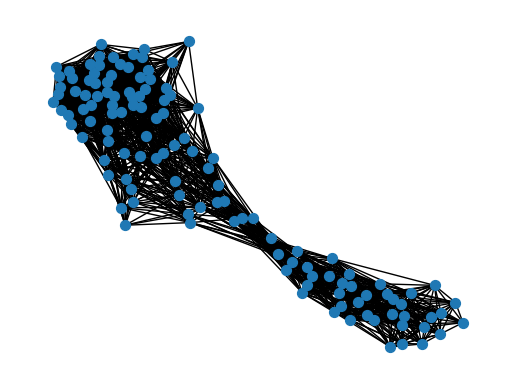

In [298]:
G = nx.Graph()
G.add_nodes_from(nodes[clump_node_mask])
G.add_edges_from(np.array(close_edge_list50)[clump_edge_mask])
fig, ax = plt.subplots()
nx.draw(G, node_size=50, ax = ax)

In [299]:
def draw_graph_mask(nodes, edges, mask, ax = None):
    colors = ['b'] * len(nodes)
    colors = np.array(colors)
    colors[mask] = 'r'
    G = nx.Graph()
    G.add_nodes_from(nodes)
    G.add_edges_from(edges)
    if ax is not None:
        fig, ax = plt.subplots()
        nx.draw(G, node_size=50, node_color=colors, ax = ax)
    else:
        nx.draw(G, node_size=5, node_color=colors)

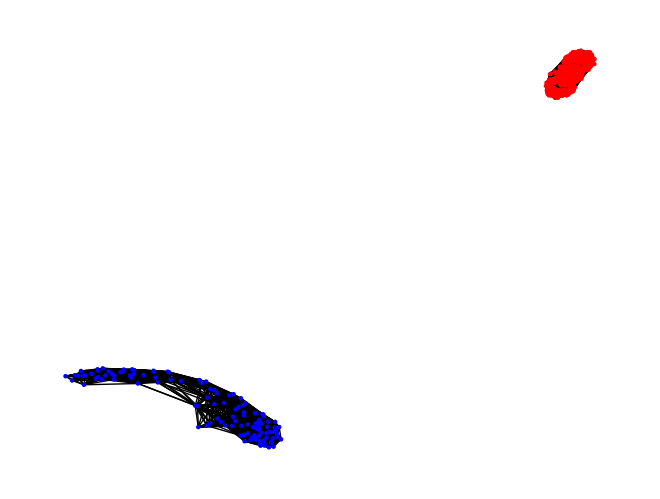

In [300]:
draw_graph_mask(nodes, close_edge_list50, mask = x1 < 1)

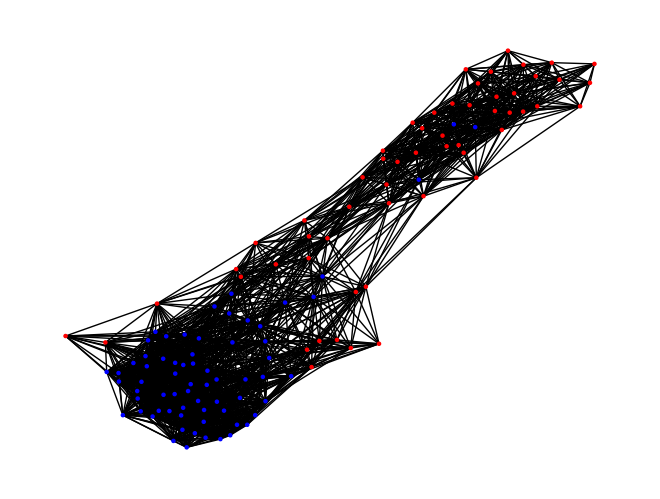

In [301]:
draw_graph_mask(nodes[clump_node_mask], np.array(close_edge_list50)[clump_edge_mask], mask = (x2[clump_node_mask] < 0))

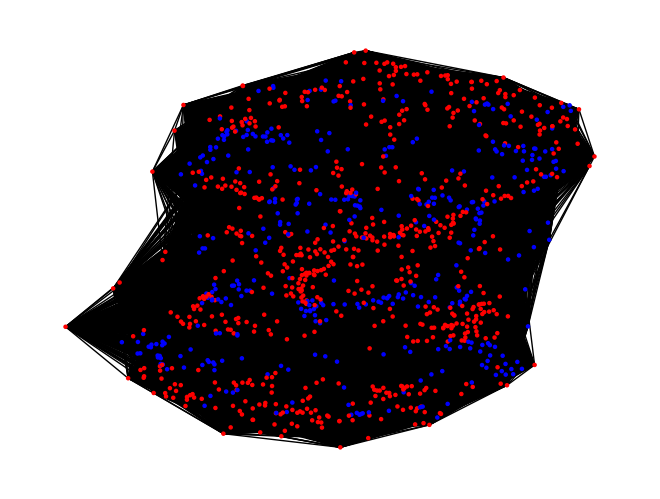

In [302]:
draw_graph_mask(nodes[~clump_node_mask], np.array(close_edge_list50)[~clump_edge_mask], mask = (x2[~clump_node_mask] < 0))

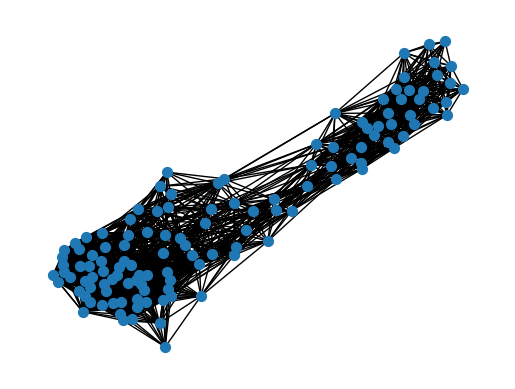

In [227]:
G = nx.Graph()
G.add_nodes_from(nodes[clump_node_mask])
G.add_edges_from(np.array(close_edge_list50)[clump_edge_mask])
fig, ax = plt.subplots()
nx.draw(G, node_size=50, ax = ax)

In [85]:
def normalize(arr):
    return (arr - np.min(arr)) / (np.max(arr) - np.min(arr))

In [86]:
cmap = mpl.colormaps['Spectral']

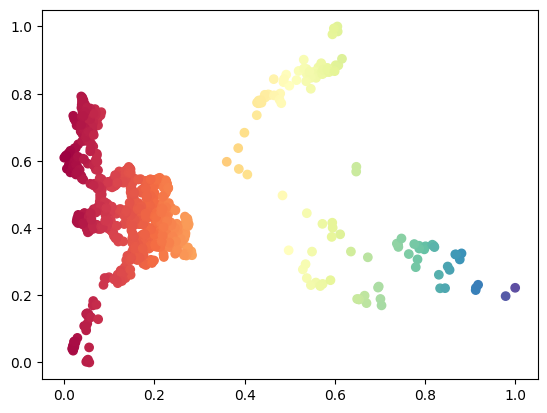

In [303]:
f = plt.scatter(normalize(x1), normalize(x2), c =normalize(x1), cmap=cmap)

In [339]:
x

array([[ 4.511553  ,  4.413802  ,  3.314443  , ...,  1.9546659 ,
         1.5557067 ,  1.943468  ],
       [ 0.21895775,  0.25922993,  2.6648476 , ...,  0.7575149 ,
        -0.09410376,  0.28580117],
       [ 1.0645125 ,  1.0798794 , -2.6106975 , ..., -1.5517457 ,
        -1.4544861 ,  0.11475484],
       ...,
       [ 2.382737  ,  2.321344  , -1.3254387 , ..., -0.8326811 ,
        -1.1098881 ,  0.6599329 ],
       [-0.42420965, -0.38886192, -1.4178963 , ...,  0.46333933,
        -0.5888034 , -0.08412288],
       [ 0.86581725,  0.9252132 ,  2.3128972 , ...,  0.6144337 ,
         1.545218  ,  1.2597965 ]])

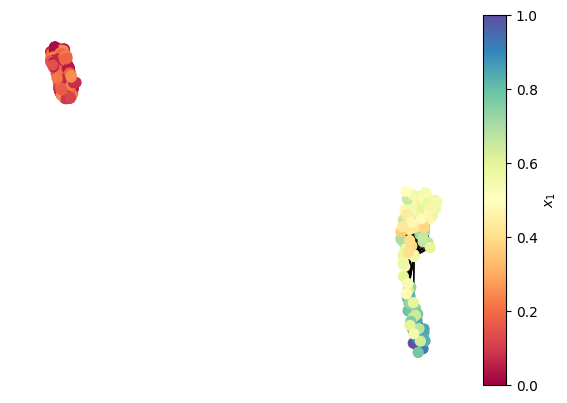

In [340]:
fig,ax = plt.subplots()
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.05)
G = nx.Graph()
G.add_nodes_from(nodes)
G.add_edges_from(np.array(close_edge_list50))
nx.draw(G, node_size=50, node_color=cmap(normalize(x1)), ax=ax)
cbar = plt.colorbar(f, cax=cax)
cbar.set_label("$x_1$")
plt.show()

In [353]:
normalize(x1)[clump_node_mask]

array([0.60637752, 0.59468831, 0.97883683, 0.60571127, 1.        ,
       0.85454899, 0.59787851, 0.85034525, 0.78670982, 0.56972611,
       0.56540155, 0.5720455 , 0.91278269, 0.80115143, 0.56353042,
       0.79846981, 0.57072726, 0.56401312, 0.6958627 , 0.5545166 ,
       0.53764791, 0.69743488, 0.91245173, 0.57596428, 0.78716865,
       0.57998818, 0.87714747, 0.81964924, 0.88101803, 0.5926282 ,
       0.601871  , 0.81633489, 0.70121214, 0.58363123, 0.55885212,
       0.8209064 , 0.51976258, 0.91782535, 0.60778426, 0.57090368,
       0.77617017, 0.56983454, 0.83348036, 0.74093135, 0.55830413,
       0.57250143, 0.48613808, 0.49222652, 0.57506259, 0.64777756,
       0.84452914, 0.78343978, 0.64741084, 0.53111522, 0.5883953 ,
       0.5150135 , 0.49912767, 0.67026213, 0.45557622, 0.66608103,
       0.86881514, 0.58710645, 0.70361613, 0.4871983 , 0.7403665 ,
       0.58331634, 0.4788973 , 0.53727548, 0.65337345, 0.44569218,
       0.46460528, 0.76407066, 0.86720456, 0.61589004, 0.59967

In [375]:
def plot_graph_color_by(nodes, edges, thing_to_color_by, node_mask = None):
    fig,ax = plt.subplots()
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    G = nx.Graph()
    G.add_nodes_from(nodes)
    G.add_edges_from(edges)
    if node_mask is None:
        nx.draw(G, node_size=50, node_color=cmap(normalize(thing_to_color_by)), ax=ax)
    else:
        colors = np.array(cmap(normalize(thing_to_color_by)))
        nx.draw(G, node_size=50, node_color=colors[node_mask], ax=ax)
    cbar = plt.colorbar(f, cax=cax)
    cbar.set_label("$x_1$")
    plt.show()

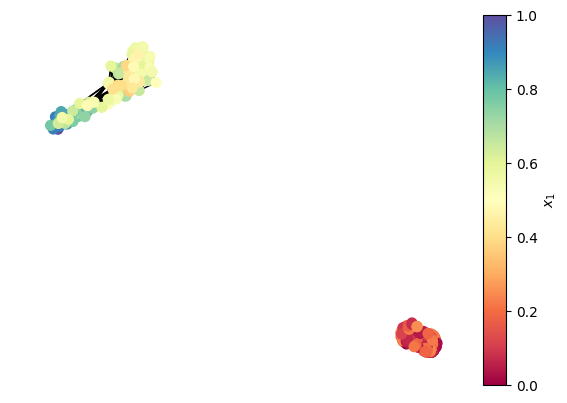

In [347]:
plot_graph_color_by(nodes, close_edge_list50, x1)

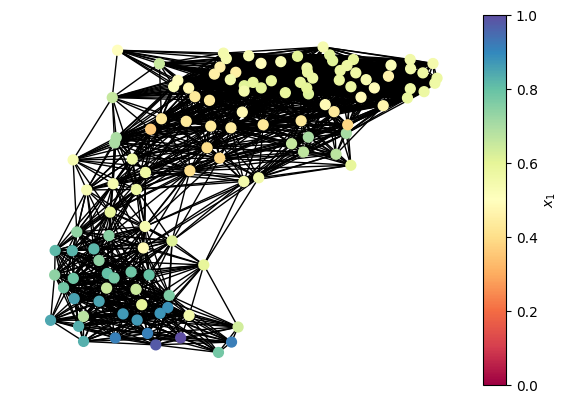

In [376]:
plot_graph_color_by(nodes[clump_node_mask], np.array(close_edge_list50)[clump_edge_mask], x1, node_mask = clump_node_mask)

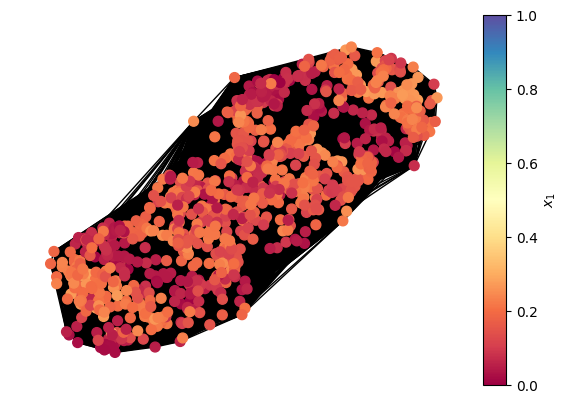

In [377]:
plot_graph_color_by(nodes[~clump_node_mask], np.array(close_edge_list50)[~clump_edge_mask], x1, node_mask = ~clump_node_mask )

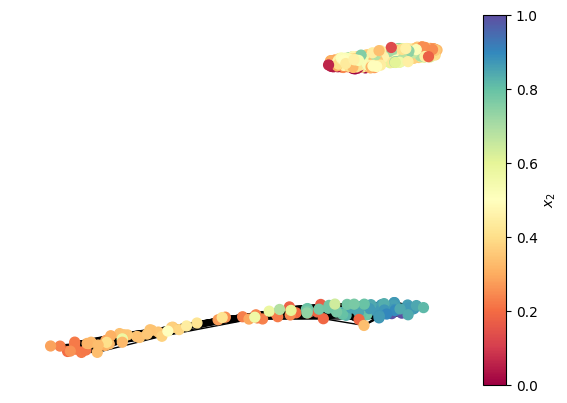

In [305]:
fig,ax = plt.subplots()
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.05)
nx.draw(G, node_size=50, node_color=cmap(normalize(x2)), ax=ax)
cbar = plt.colorbar(f, cax=cax)
cbar.set_label("$x_2$")
plt.show()

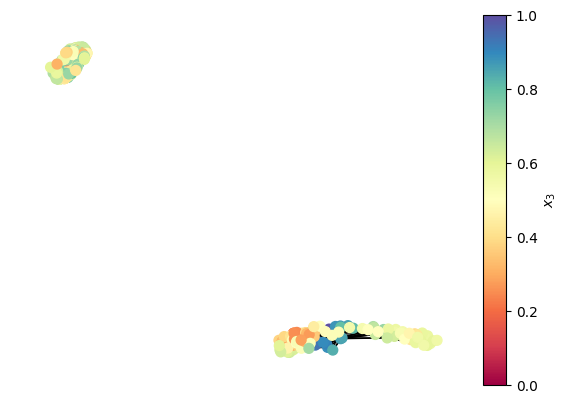

In [306]:
fig,ax = plt.subplots()
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.05)
nx.draw(G, node_size=50, node_color=cmap(normalize(x3)), ax=ax)
cbar = plt.colorbar(f, cax=cax)
cbar.set_label("$x_3$")
plt.show()

In [307]:
# nx.draw(G, node_size=50, node_color=cmap(normalize(np.sqrt(x1**2 + x2**2))))
# fig,ax = plt.subplots()
# divider = make_axes_locatable(ax)
# cax = divider.append_axes('right', size='5%', pad=0.05)
# nx.draw(G, node_size=50, node_color=cmap(normalize(np.sqrt(x1**2 + x2**2))), ax=ax)
# cbar = plt.colorbar(f, cax=cax)
# cbar.set_label("$\sqrt{x_1^2 + x_2^2}$")
# plt.show()
# fig.savefig("figures/colored_graph.pdf", bbox_inches='tight')

In [308]:
import plotly.graph_objects as go
from plotly.offline import plot

fig = go.Figure(data=[go.Scatter3d(x=x1, y=x2, z=x3, mode='markers',
        marker = dict(color='blue', opacity = 0.2))])

# fig.update_traces(marker_opacity=new_data.flatten()/np.max(new_data), selector=dict(type='scatter'))
fig.update_xaxes(title='PCA 1', tickfont=dict(size=68))

plot(fig, filename='pca_graph.html', auto_open=True)


'pca_graph.html'

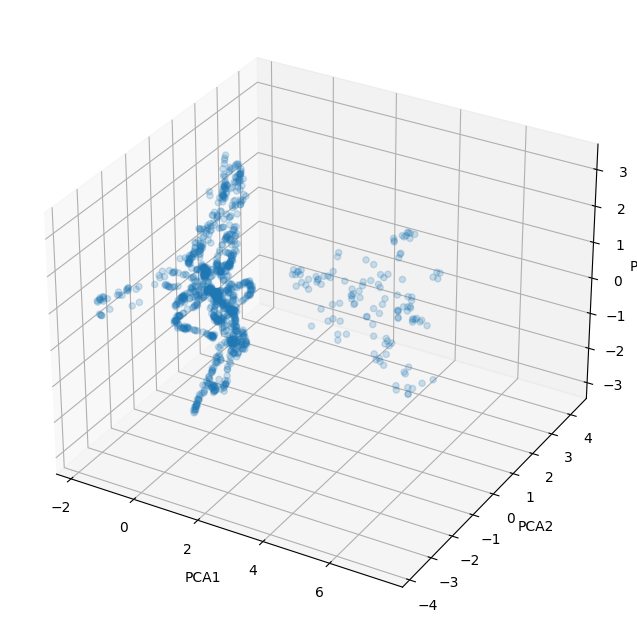

In [309]:
%matplotlib inline
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(projection='3d')

ax.scatter(x1, x2, x3, alpha=0.2)

ax.set_xlabel('PCA1')
ax.set_ylabel('PCA2')
ax.set_zlabel('PCA3')

plt.show()

In [381]:
int(nodes)

TypeError: only size-1 arrays can be converted to Python scalars

In [382]:
def plot_color_by(key, other_key = None, vmin=None, vmax=None, log=False, alpha=None, ret=False):
    thing_to_color_by = data[7].data[key][~np.isnan(all_zs)][close_mask][nodes.astype(int)]
    # thing_to_color_by = np.delete(thing_to_color_by, disconnected_nodes)
    colorbar_label = key[:-5]
    if other_key is not None: # we are making a color plot
        thing_to_color_by2 = data[7].data[other_key][~np.isnan(all_zs)][close_mask][nodes.astype(int)]
        # thing_to_color_by2 = np.delete(thing_to_color_by2, disconnected_nodes)
        thing_to_color_by -= thing_to_color_by2
        colorbar_label += " - " + other_key[:-5]
        if np.mean(thing_to_color_by2) == 0:
            return
    if np.mean(thing_to_color_by) == 0:
        return
    if log:
        colorbar_label = "$\log_{10}(" + colorbar_label + ")$"
        thing_to_color_by = np.log10(np.abs(thing_to_color_by))
    fig = plt.figure()
    plt.scatter(x1, x2, c=thing_to_color_by, vmax=vmax, vmin=vmin, alpha=alpha)
    plt.xlabel("$x_1$")
    plt.ylabel("$x_2$")
    cbar = plt.colorbar()
    cbar.set_label(colorbar_label)
    plt.show()
    if ret:
        return fig

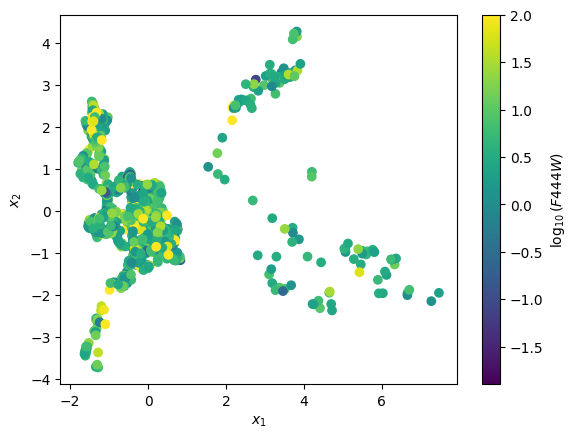

In [383]:
_ = plot_color_by('F444W_KRON', log=True, vmax=2)

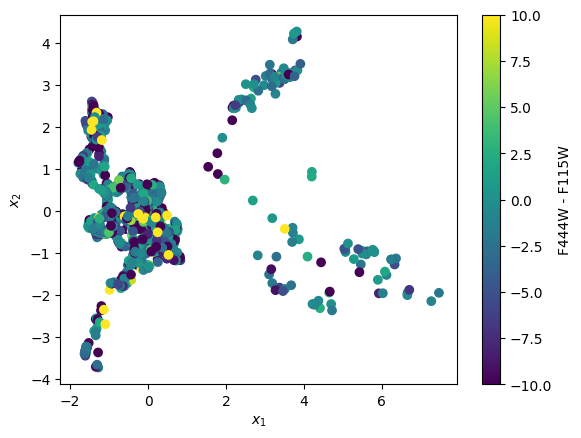

In [384]:
plot_color_by('F444W_KRON','F115W_KRON', vmax=10, vmin=-10)

In [385]:
cols = np.array(data[7].columns.names)
mask = (np.array(['KRON' in name for name in cols]) & np.array(['S' not in name for name in cols])) & np.array(['e' not in name for name in cols])
filters = cols[mask]

In [386]:
filters

array(['F090W_KRON', 'F115W_KRON', 'F150W_KRON', 'F182M_KRON',
       'F200W_KRON', 'F210M_KRON', 'F277W_KRON', 'F335M_KRON',
       'F356W_KRON', 'F410M_KRON', 'F430M_KRON', 'F444W_KRON',
       'F460M_KRON', 'F480M_KRON', 'F435W_KRON', 'F606W_KRON',
       'F775W_KRON', 'F814W_KRON', 'F850LP_KRON', 'F105W_KRON',
       'F125W_KRON', 'F140W_KRON', 'F160W_KRON'], dtype='<U15')

/var/folders/0r/_1bnthz146q2xj0c42f4nl_80000gq/T/ipykernel_39908/2047411752.py:16: RuntimeWarning:

divide by zero encountered in log10



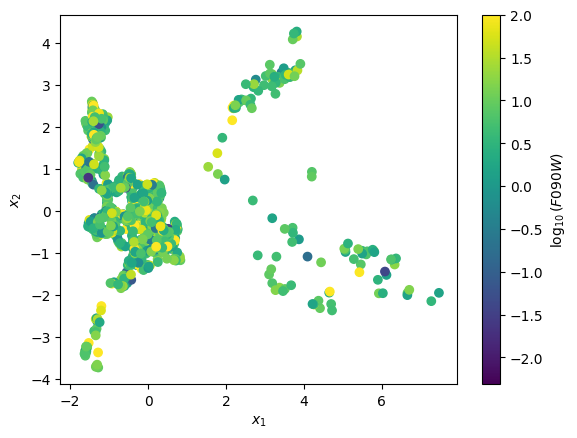

In [387]:
plot_color_by('F090W_KRON', log=True, vmax=2)

/var/folders/0r/_1bnthz146q2xj0c42f4nl_80000gq/T/ipykernel_39908/2047411752.py:16: RuntimeWarning:

divide by zero encountered in log10



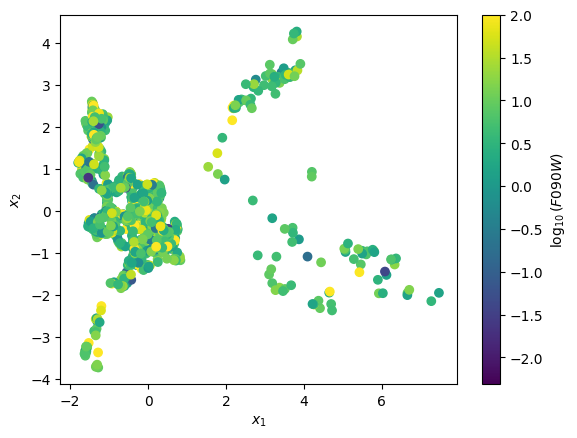

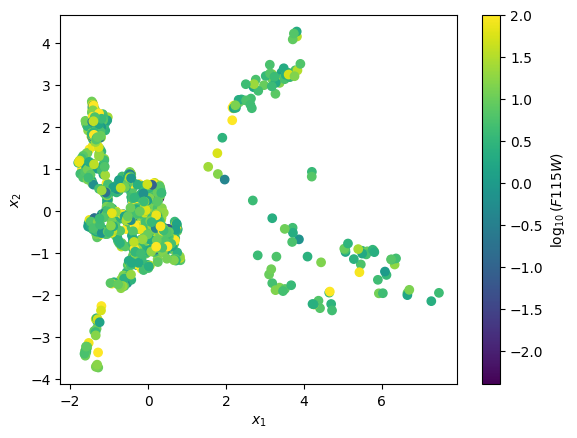

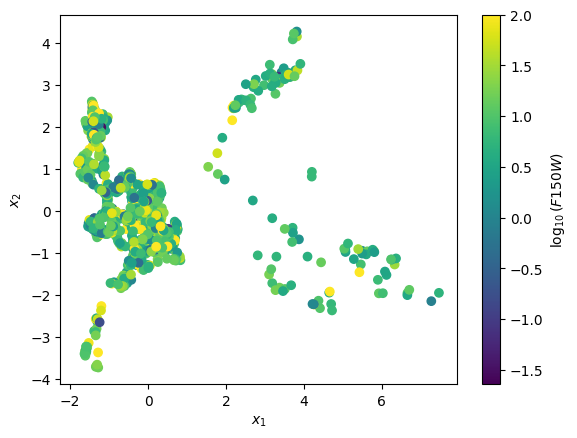

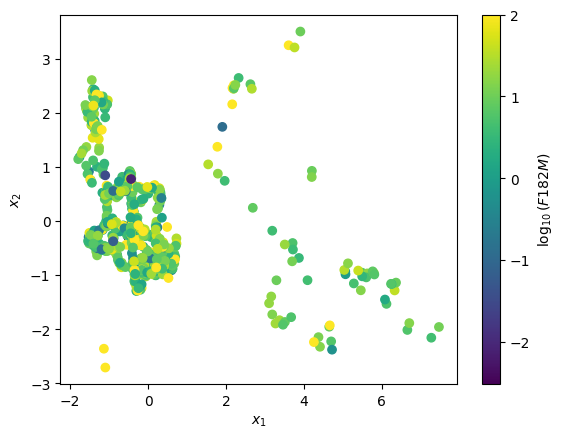

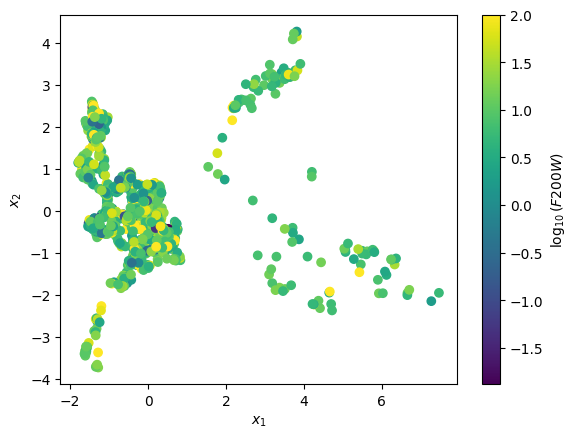

...

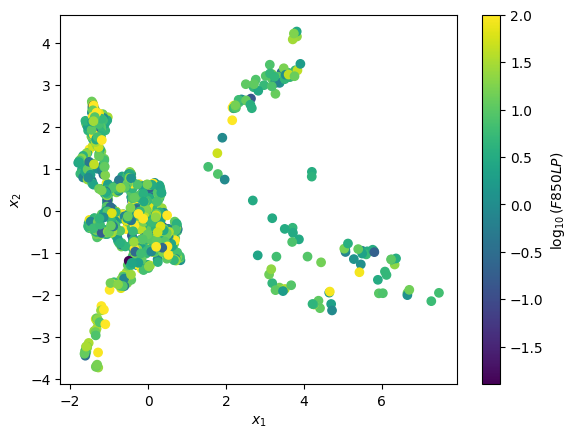

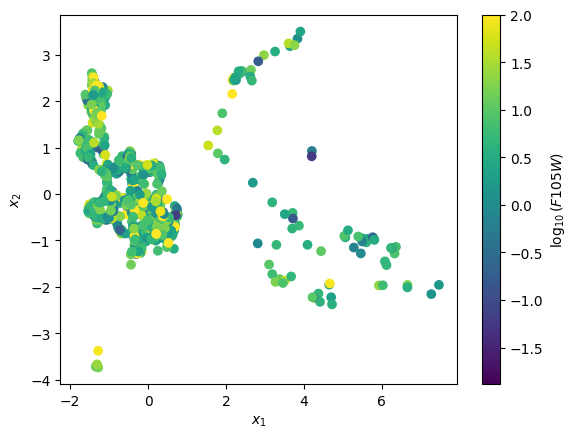

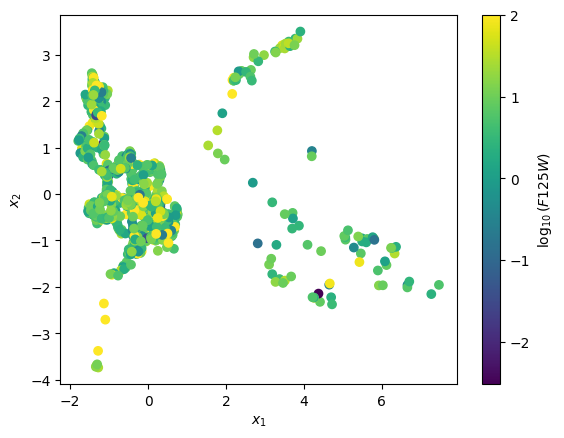

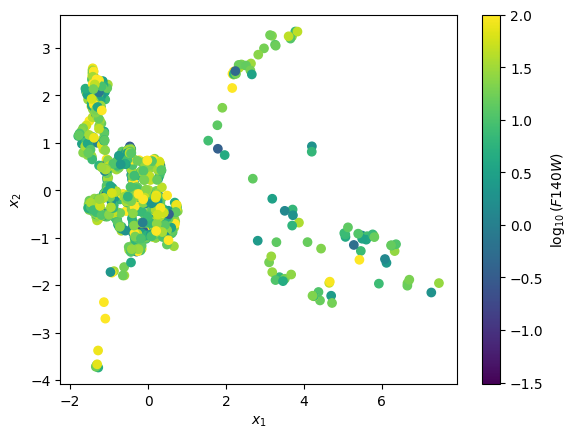

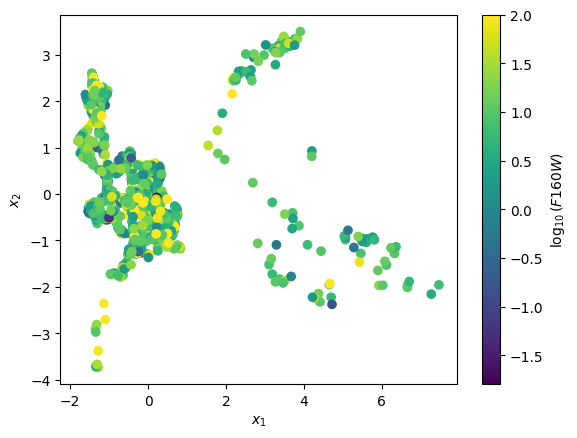

In [388]:
for filt in filters:
    try:
        plot_color_by(filt, log=True, vmax=2)
    except:
        plot_color_by(filt, vmax=10)

F090W_KRON F090W_KRON
F090W_KRON F115W_KRON


/var/folders/0r/_1bnthz146q2xj0c42f4nl_80000gq/T/ipykernel_39908/2047411752.py:16: RuntimeWarning:

divide by zero encountered in log10



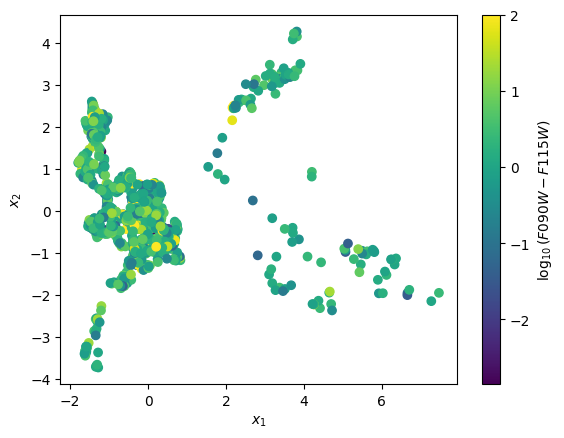

F090W_KRON F150W_KRON


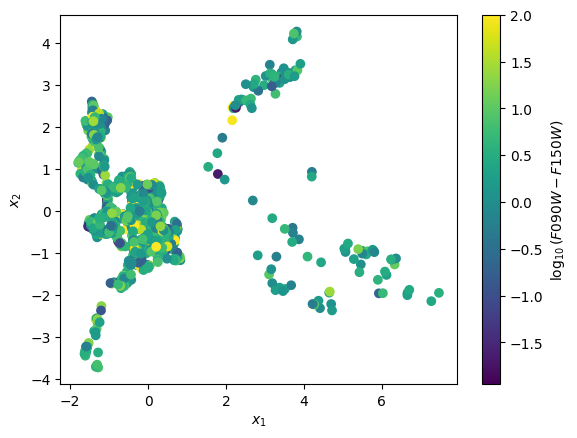

F090W_KRON F182M_KRON


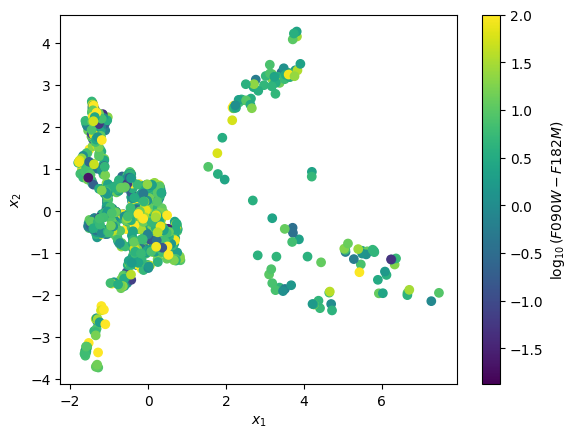

F090W_KRON F200W_KRON


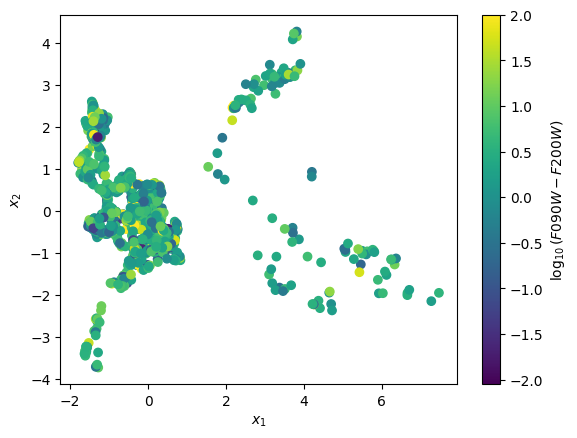

F090W_KRON F210M_KRON


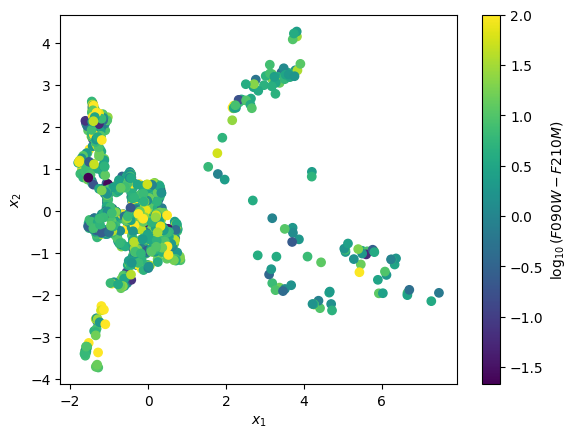

F090W_KRON F277W_KRON


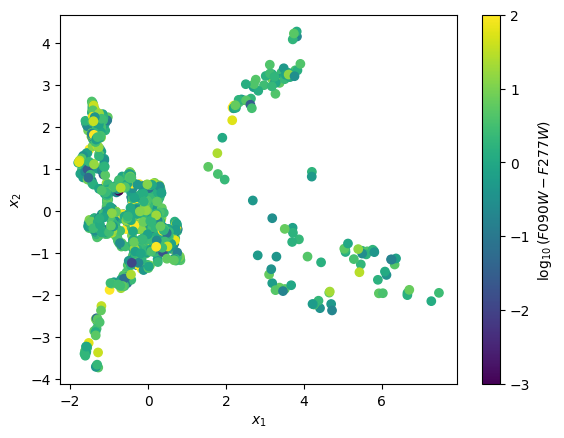

F090W_KRON F335M_KRON


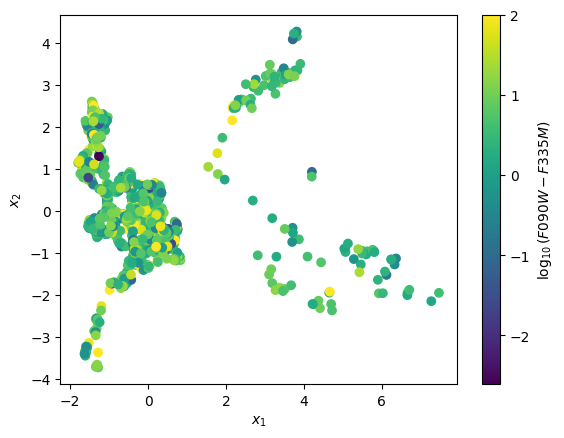

F090W_KRON F356W_KRON


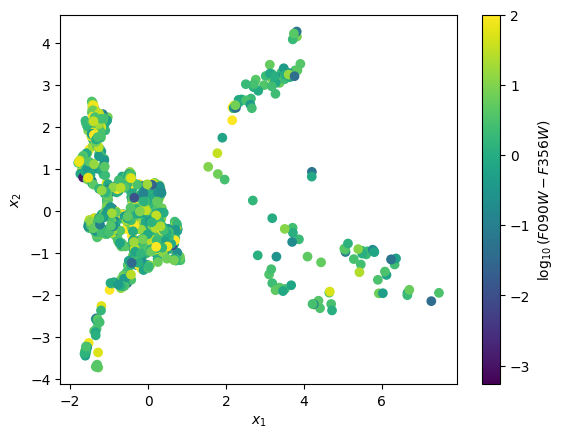

F090W_KRON F410M_KRON


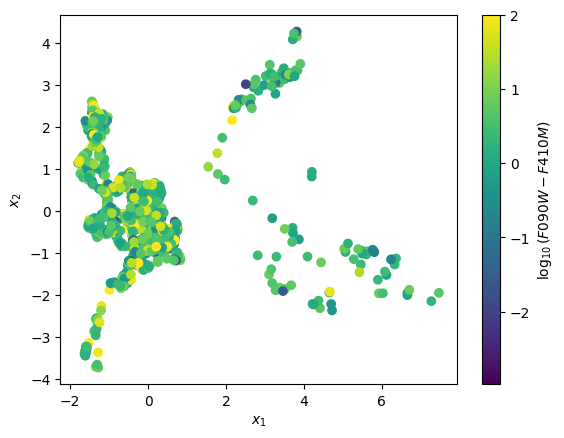

F090W_KRON F430M_KRON


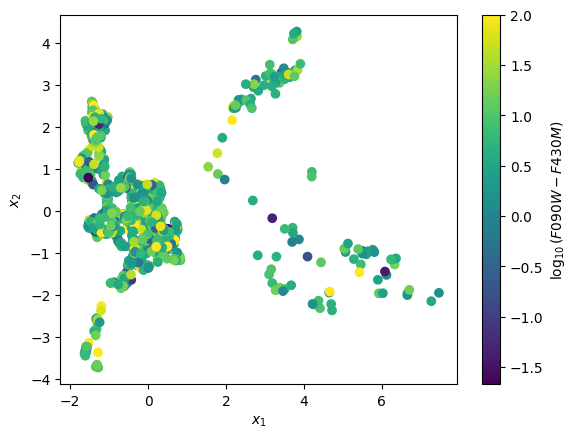

F090W_KRON F444W_KRON


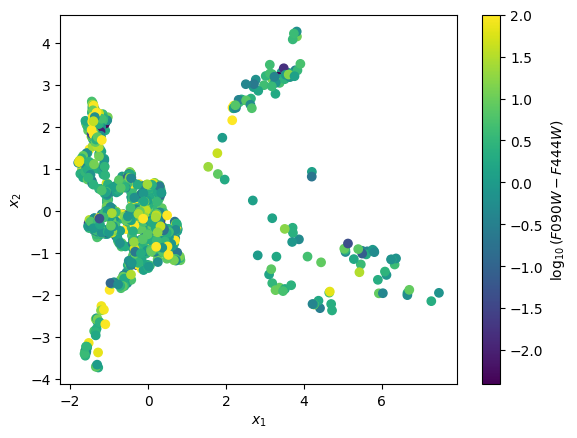

F090W_KRON F460M_KRON


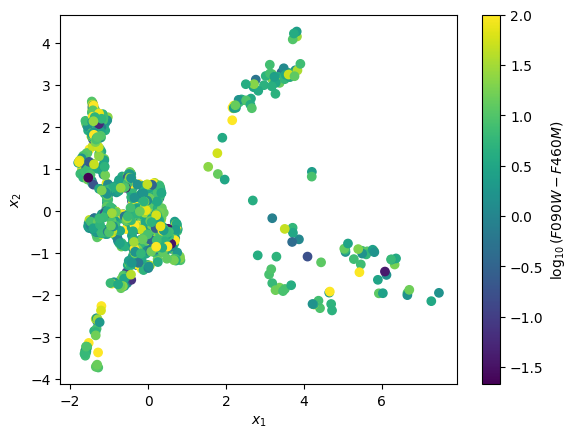

F090W_KRON F480M_KRON


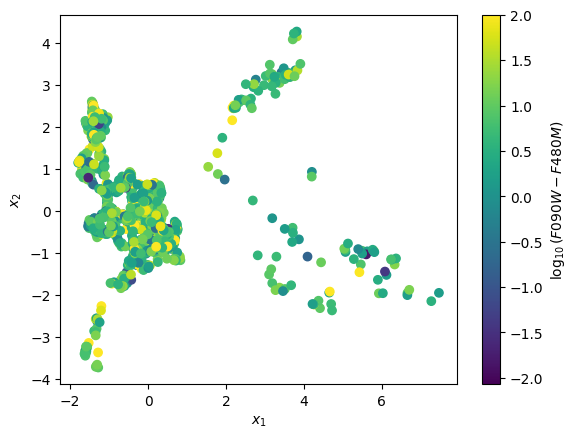

F090W_KRON F435W_KRON


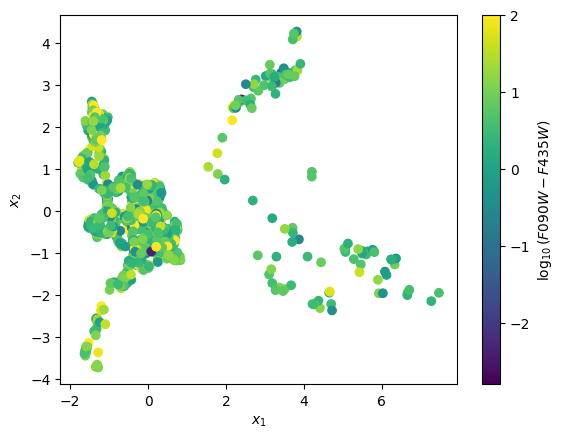

F090W_KRON F606W_KRON


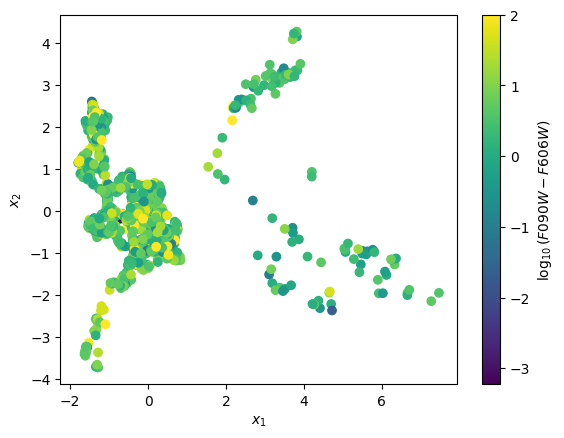

F090W_KRON F775W_KRON


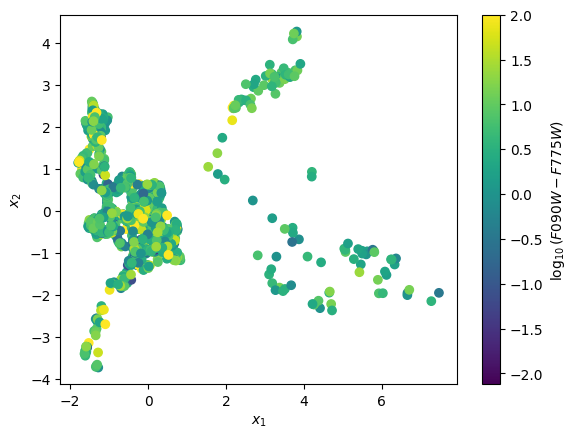

F090W_KRON F814W_KRON


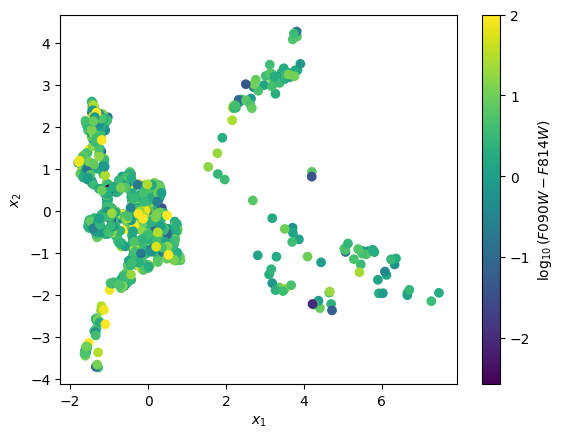

F090W_KRON F850LP_KRON


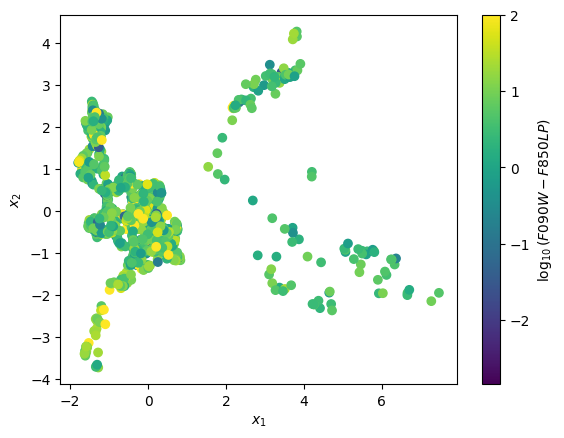

F090W_KRON F105W_KRON


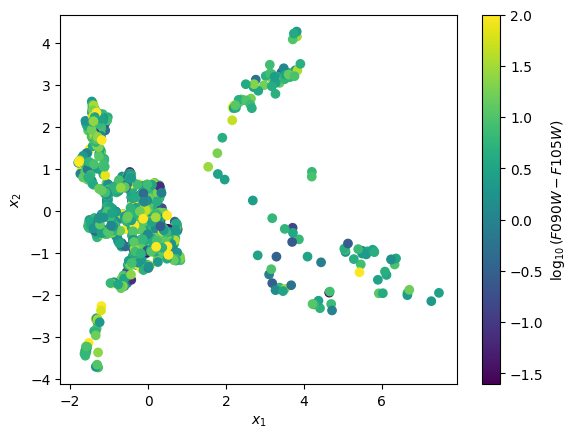

F090W_KRON F125W_KRON


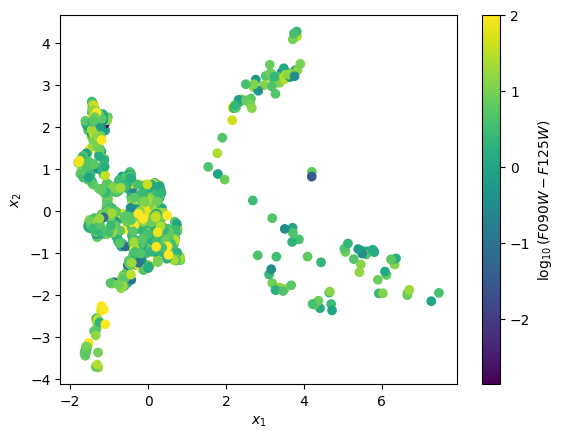

F090W_KRON F140W_KRON


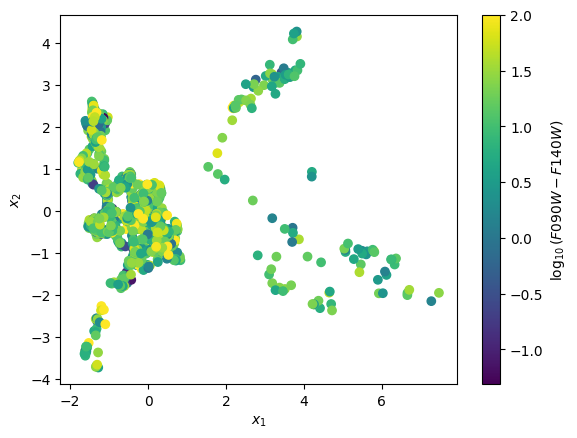

F090W_KRON F160W_KRON


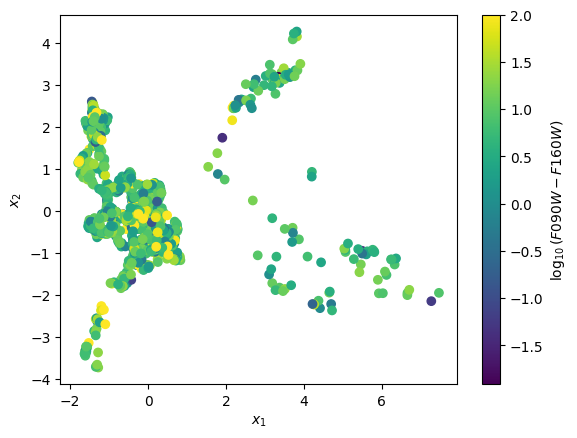

F115W_KRON F090W_KRON


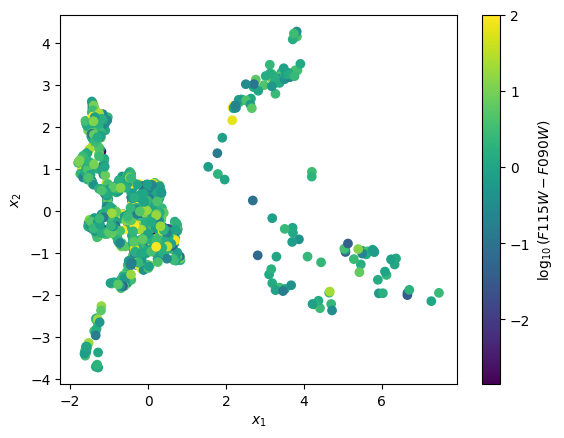

F115W_KRON F115W_KRON
F115W_KRON F150W_KRON


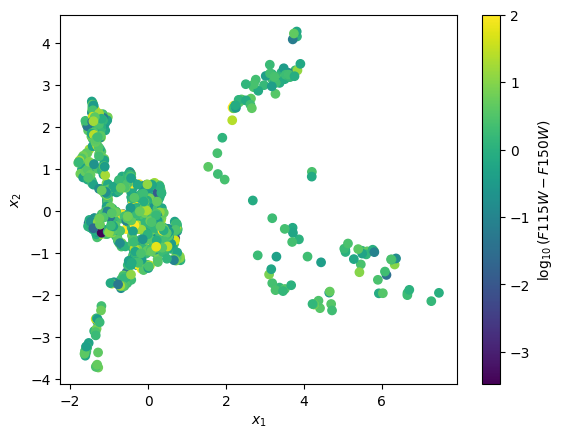

F115W_KRON F182M_KRON


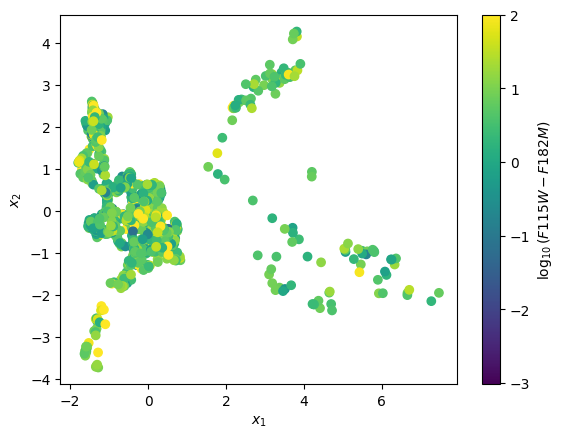

F115W_KRON F200W_KRON


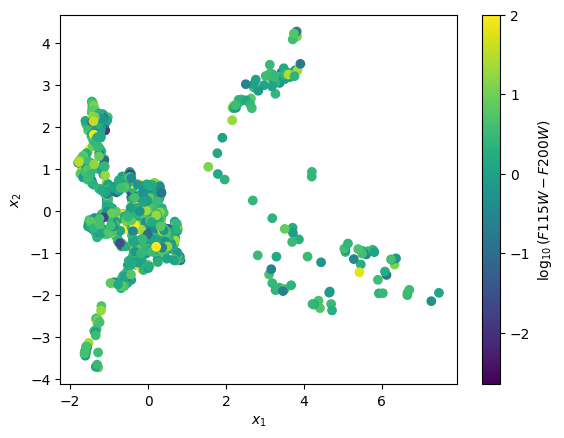

F115W_KRON F210M_KRON


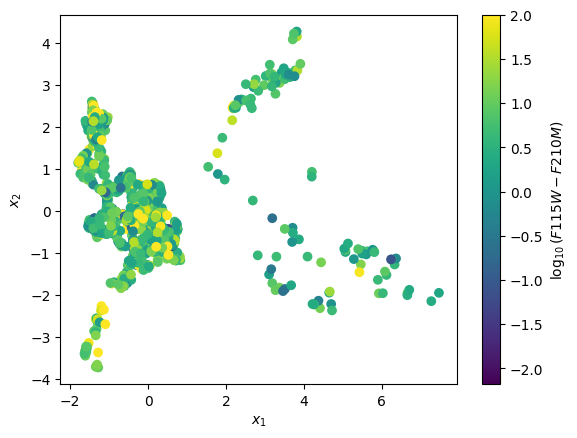

F115W_KRON F277W_KRON


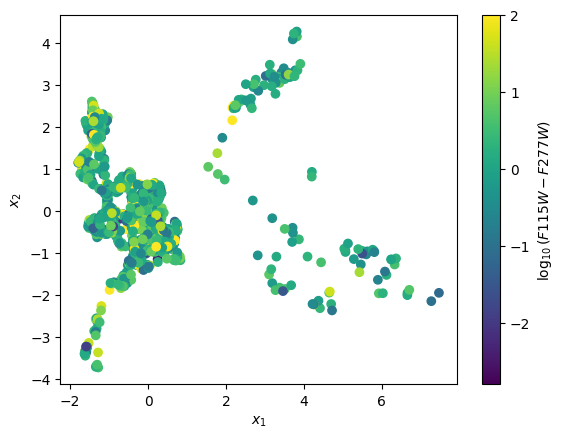

F115W_KRON F335M_KRON


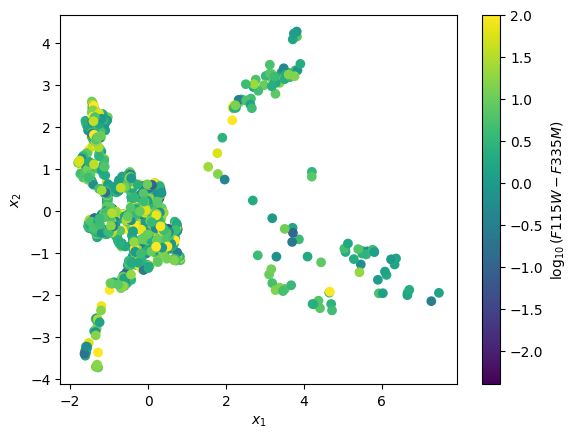

F115W_KRON F356W_KRON


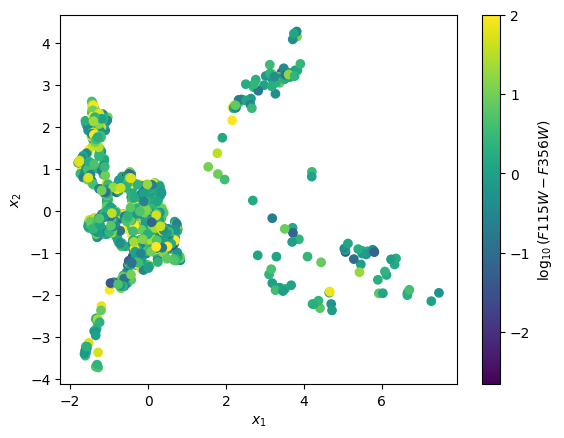

F115W_KRON F410M_KRON


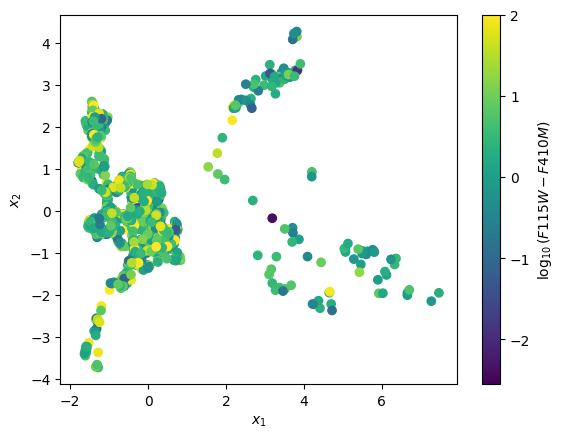

F115W_KRON F430M_KRON


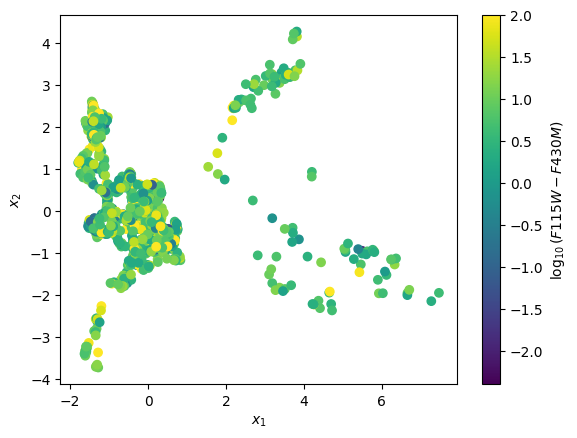

F115W_KRON F444W_KRON


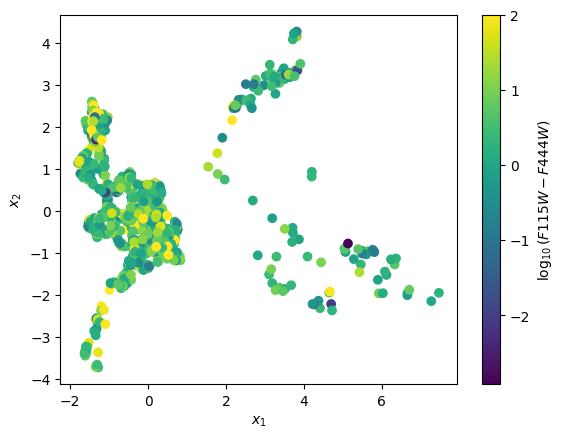

F115W_KRON F460M_KRON


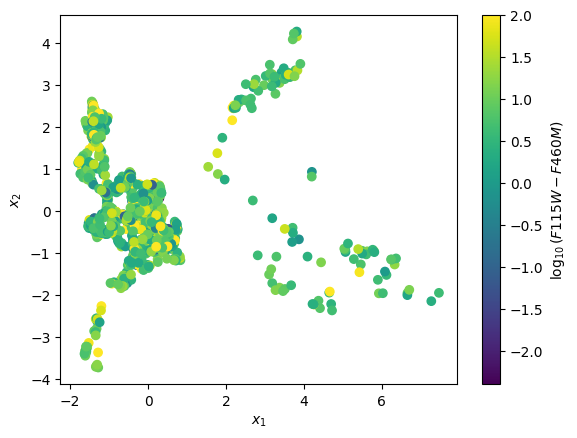

F115W_KRON F480M_KRON


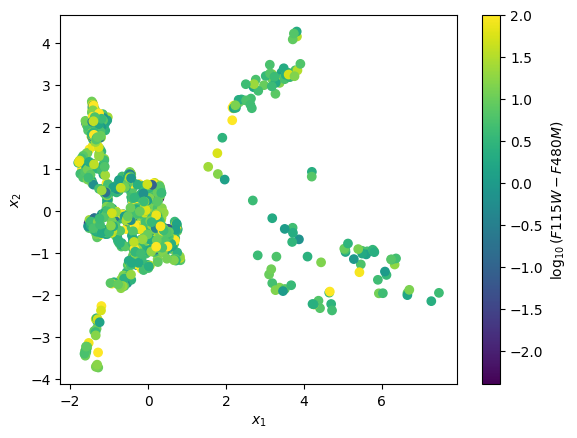

F115W_KRON F435W_KRON


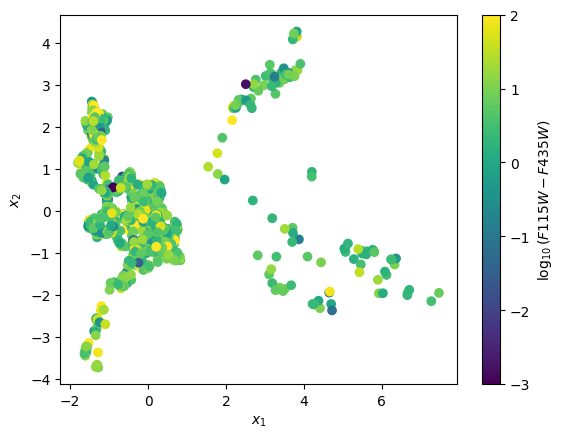

F115W_KRON F606W_KRON


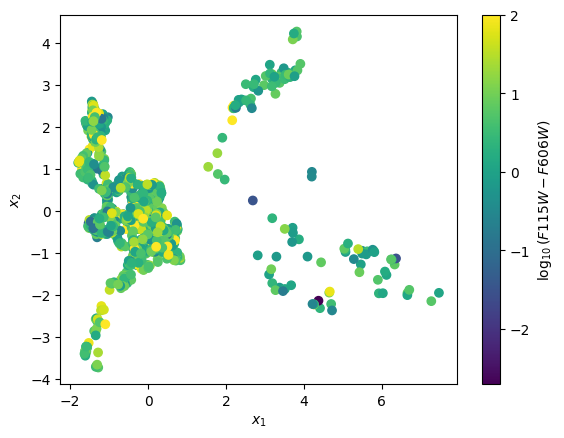

F115W_KRON F775W_KRON


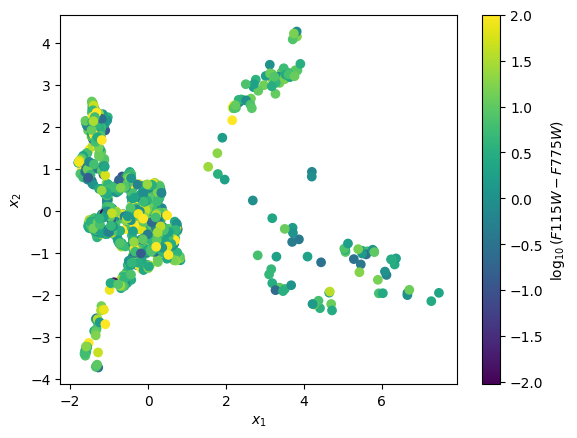

F115W_KRON F814W_KRON


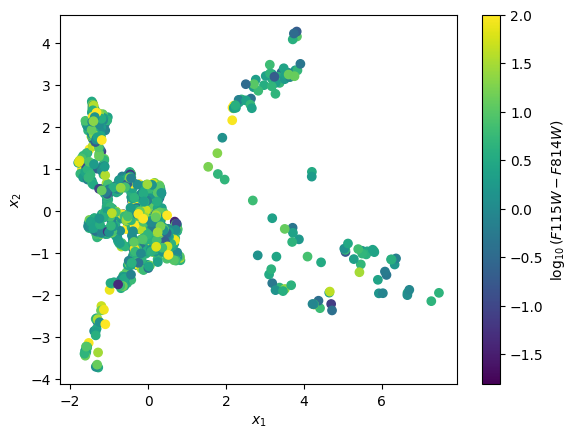

F115W_KRON F850LP_KRON


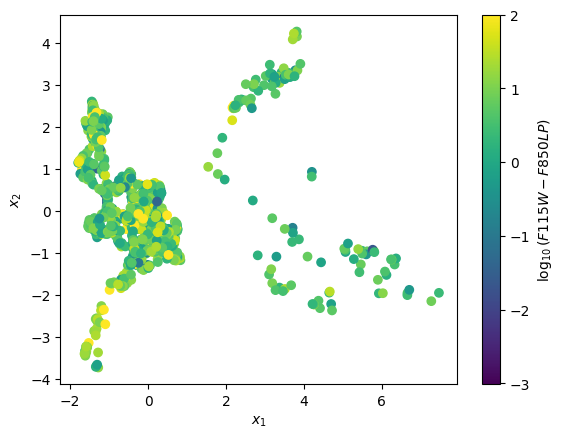

F115W_KRON F105W_KRON


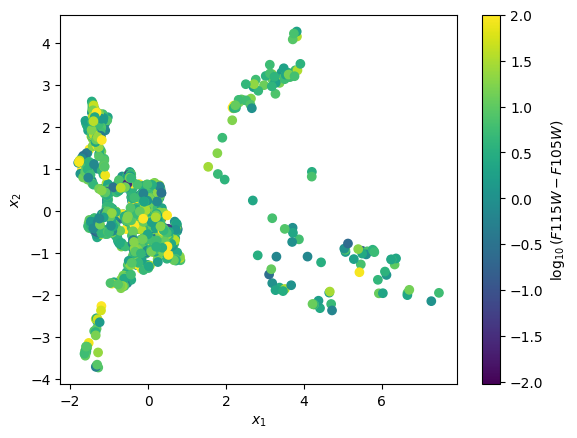

F115W_KRON F125W_KRON


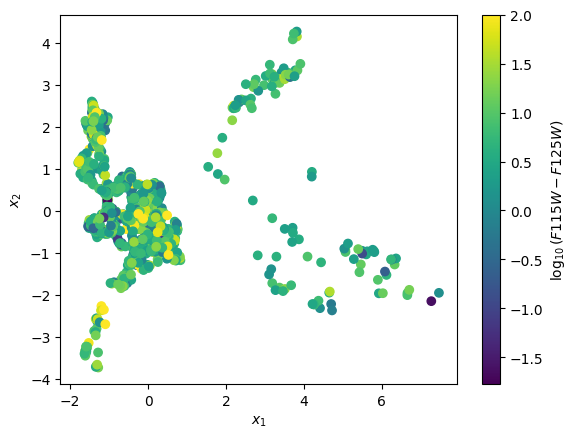

F115W_KRON F140W_KRON


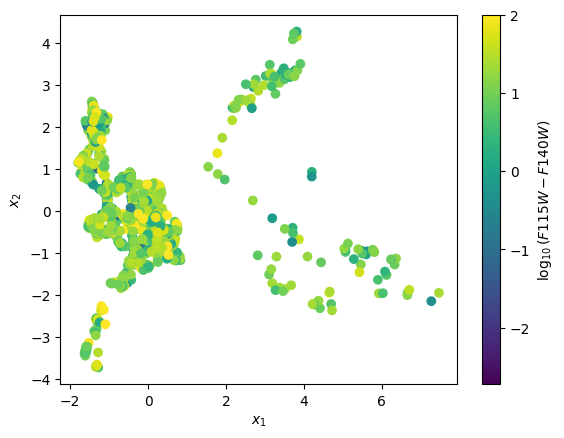

F115W_KRON F160W_KRON


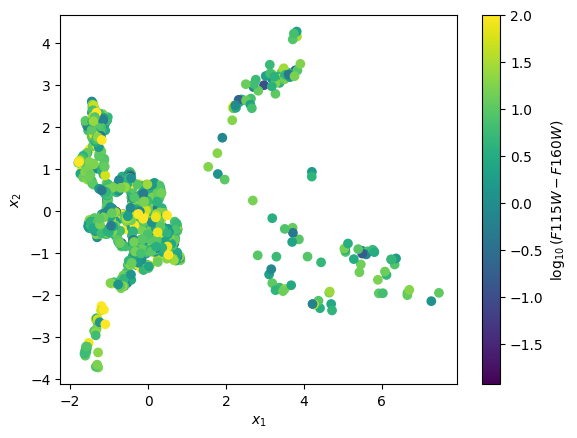

F150W_KRON F090W_KRON


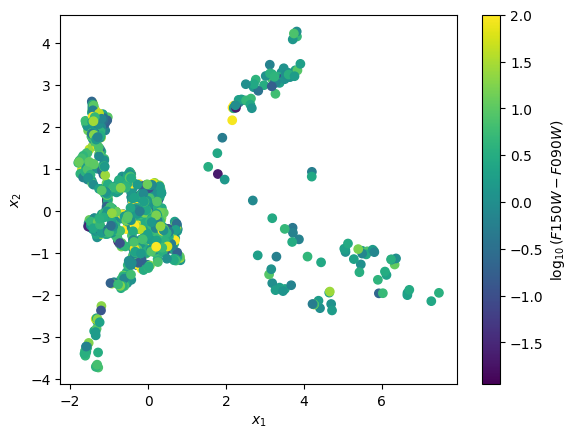

F150W_KRON F115W_KRON


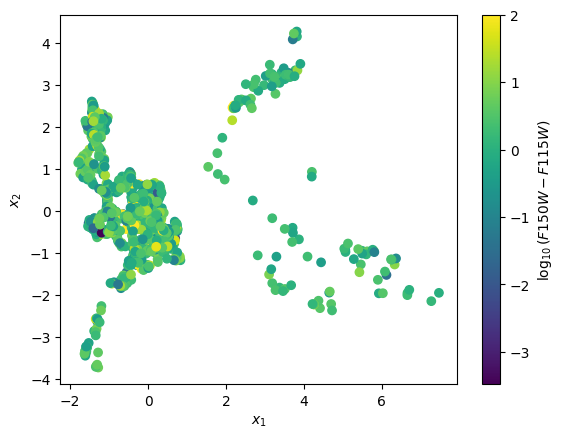

F150W_KRON F150W_KRON
F150W_KRON F182M_KRON


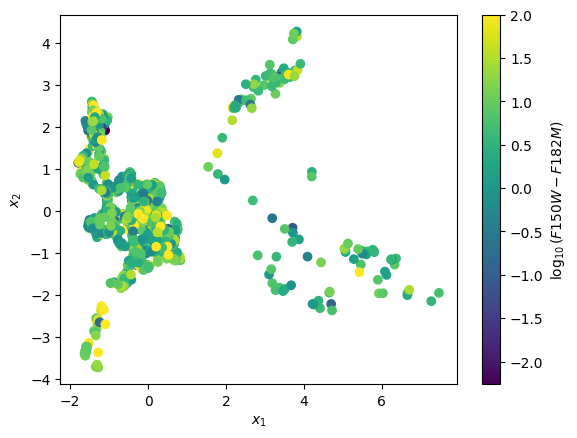

F150W_KRON F200W_KRON


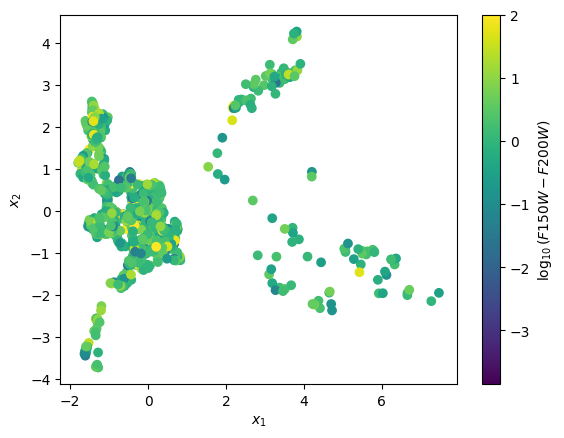

F150W_KRON F210M_KRON


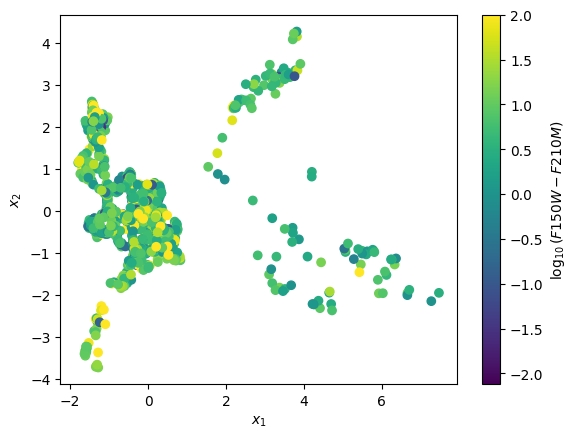

F150W_KRON F277W_KRON


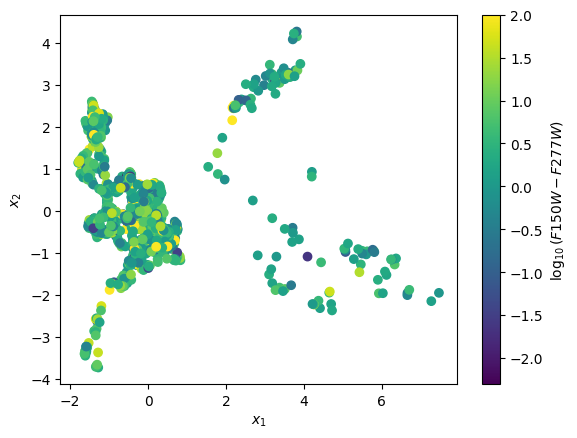

F150W_KRON F335M_KRON


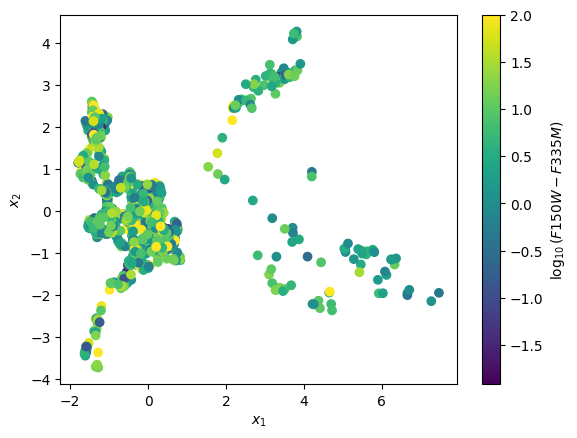

F150W_KRON F356W_KRON


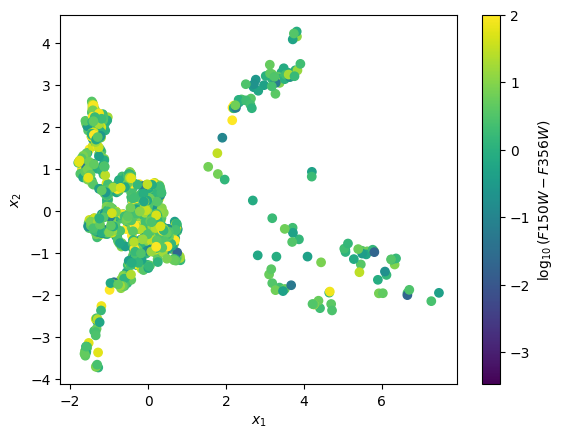

F150W_KRON F410M_KRON


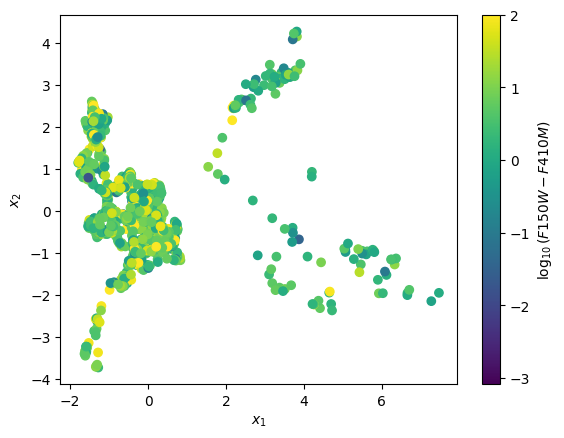

F150W_KRON F430M_KRON


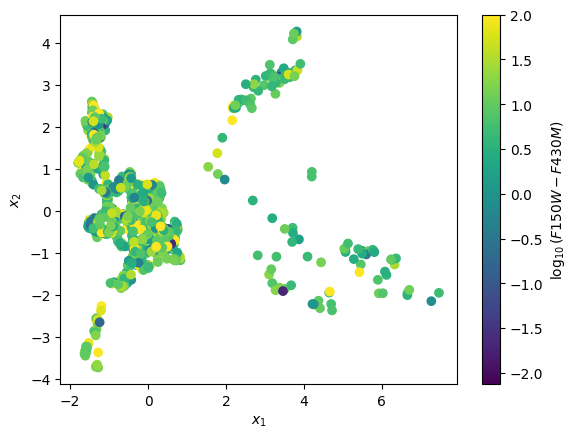

F150W_KRON F444W_KRON


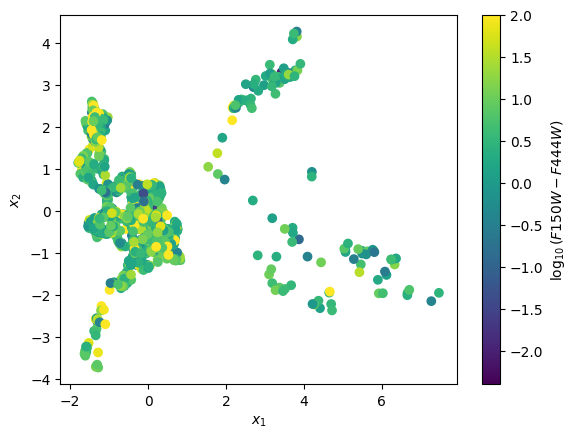

F150W_KRON F460M_KRON


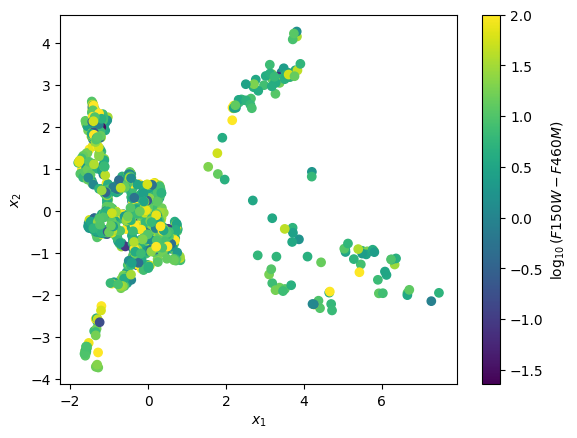

F150W_KRON F480M_KRON


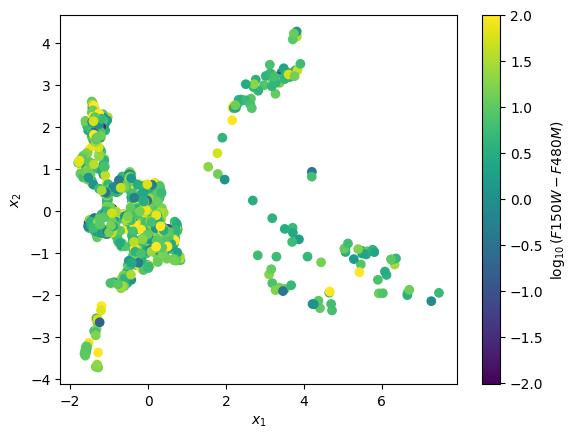

F150W_KRON F435W_KRON


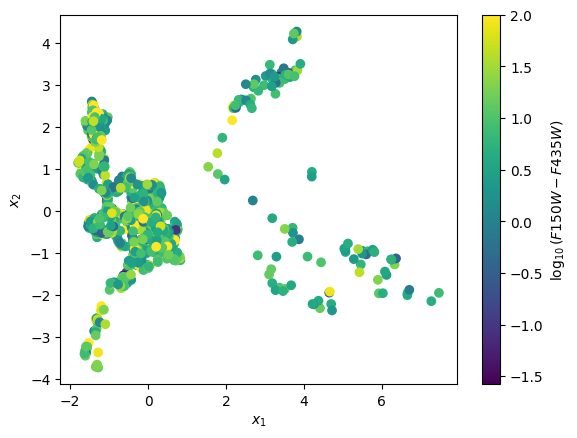

F150W_KRON F606W_KRON


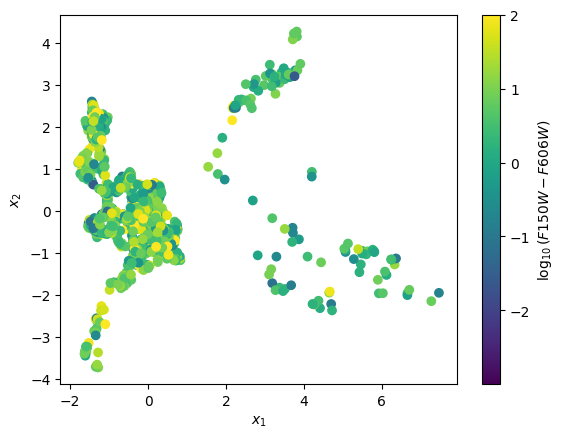

F150W_KRON F775W_KRON


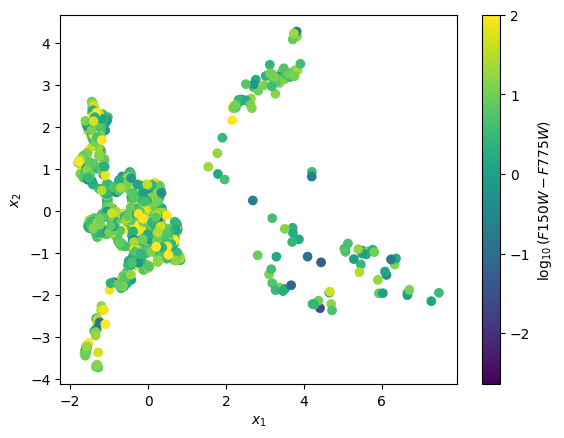

F150W_KRON F814W_KRON


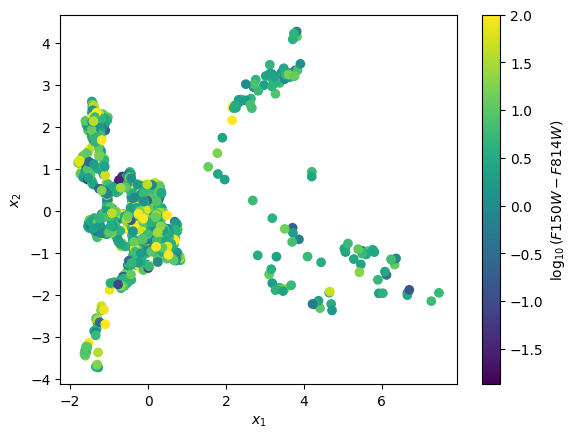

F150W_KRON F850LP_KRON


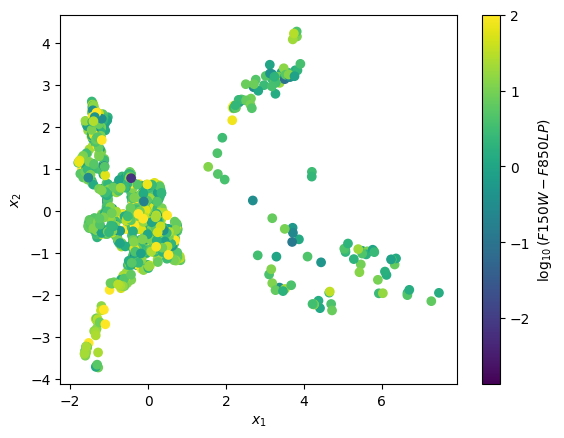

F150W_KRON F105W_KRON


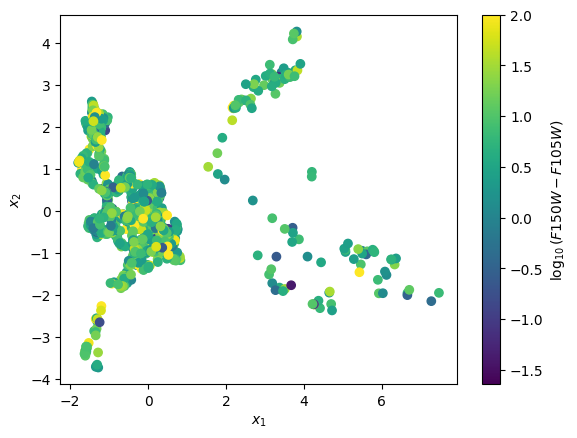

F150W_KRON F125W_KRON


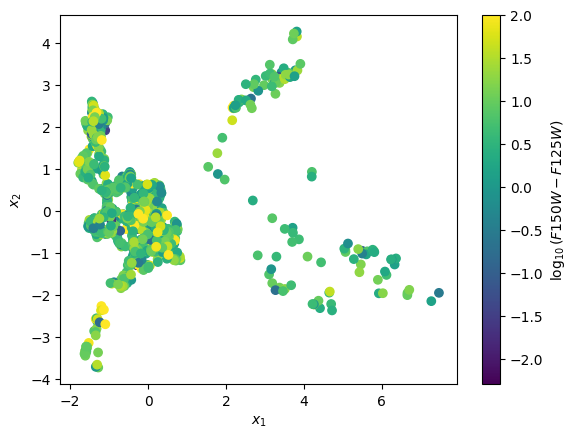

F150W_KRON F140W_KRON


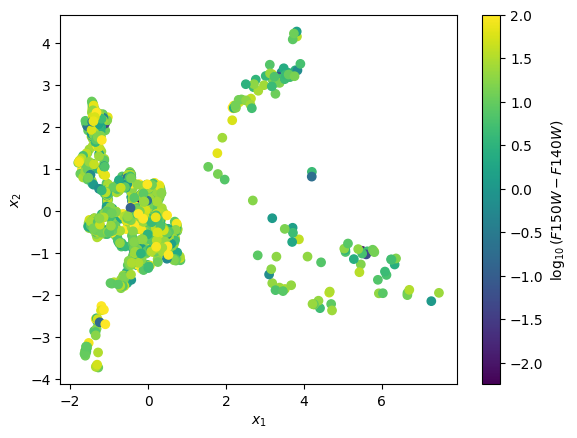

F150W_KRON F160W_KRON


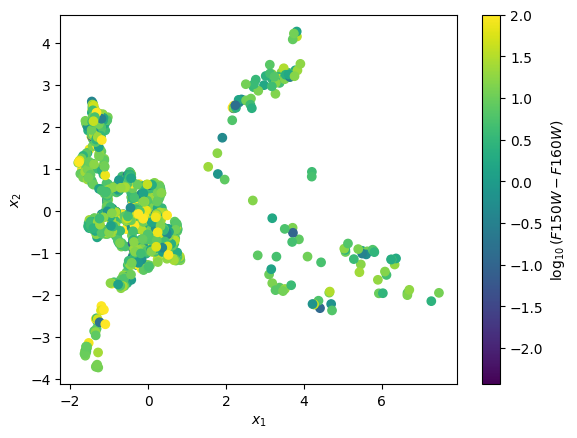

F182M_KRON F090W_KRON


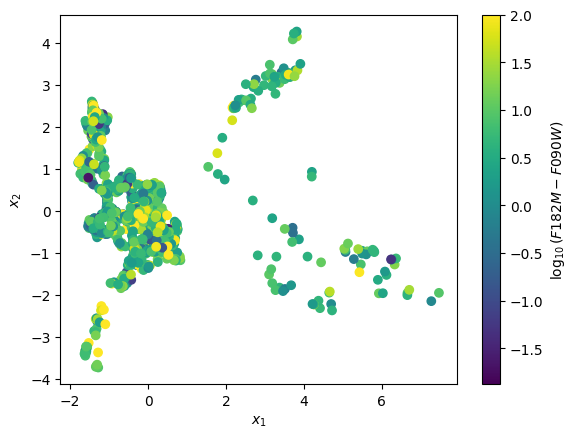

F182M_KRON F115W_KRON


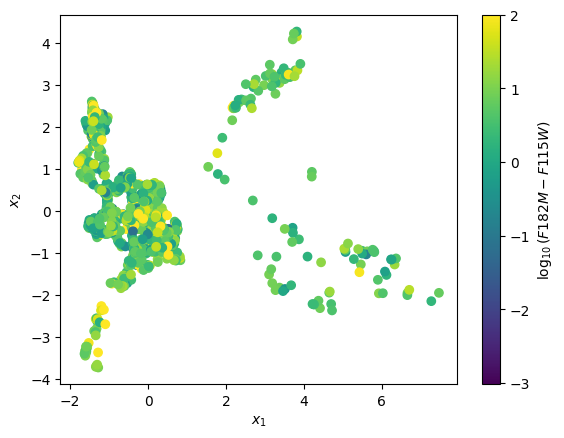

F182M_KRON F150W_KRON


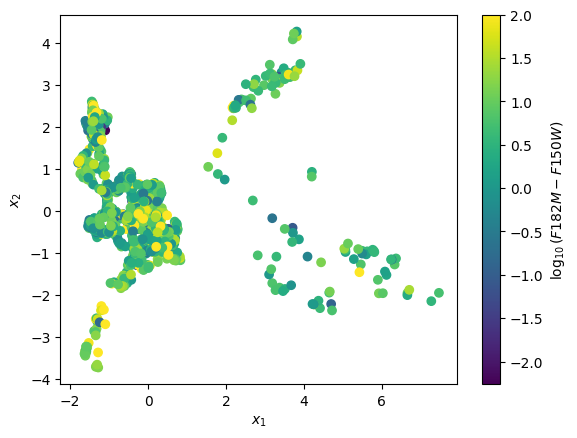

F182M_KRON F182M_KRON
F182M_KRON F200W_KRON


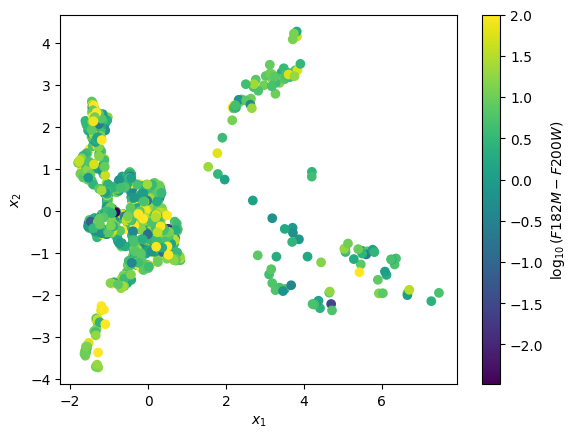

F182M_KRON F210M_KRON


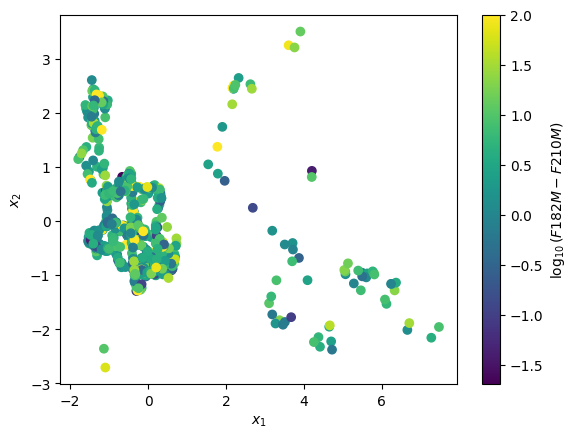

F182M_KRON F277W_KRON


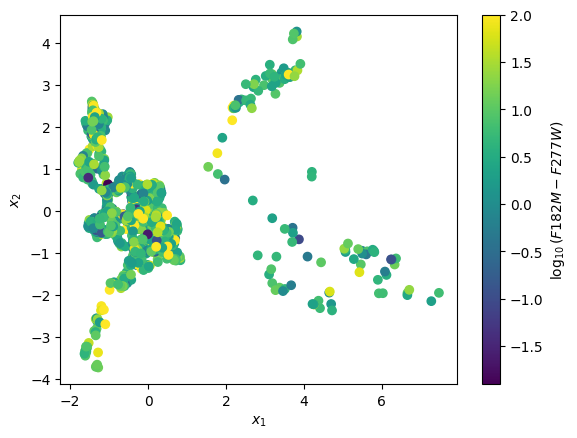

F182M_KRON F335M_KRON


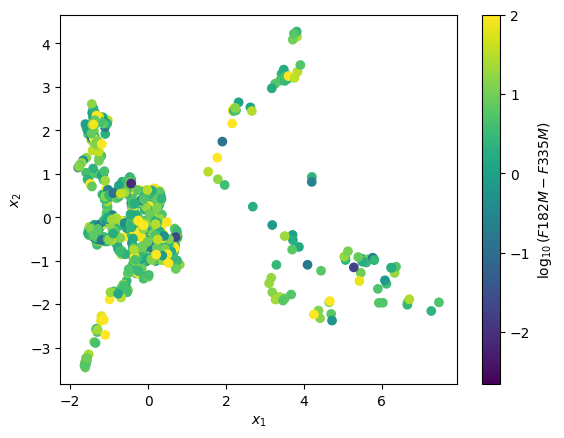

F182M_KRON F356W_KRON


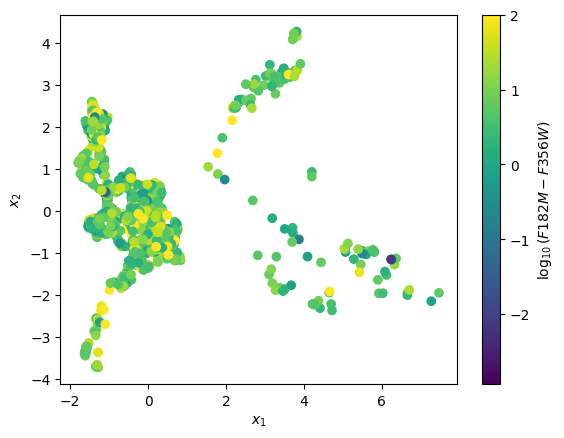

F182M_KRON F410M_KRON


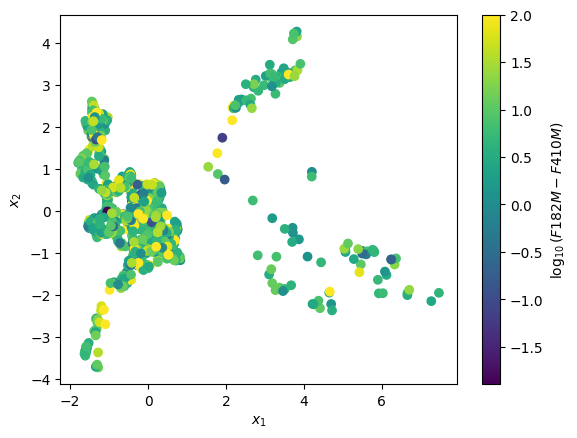

F182M_KRON F430M_KRON


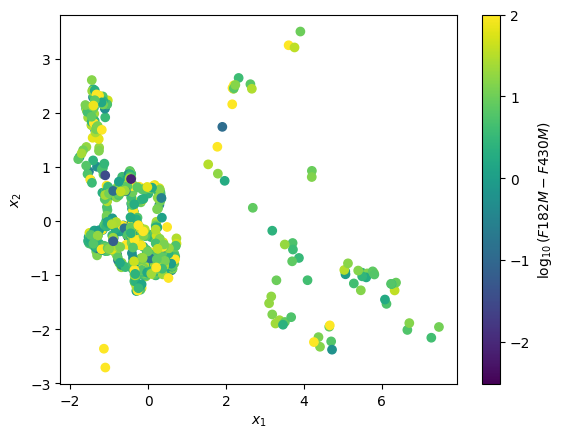

F182M_KRON F444W_KRON


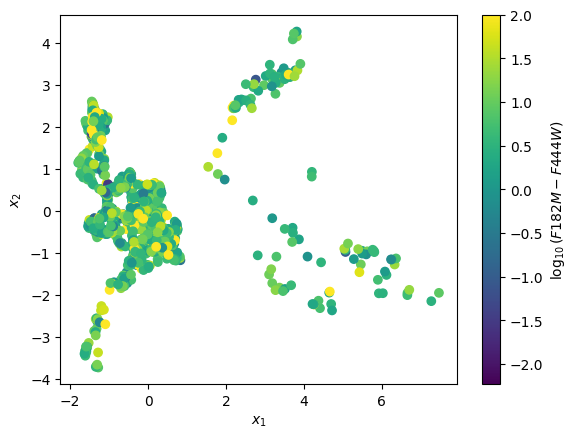

F182M_KRON F460M_KRON


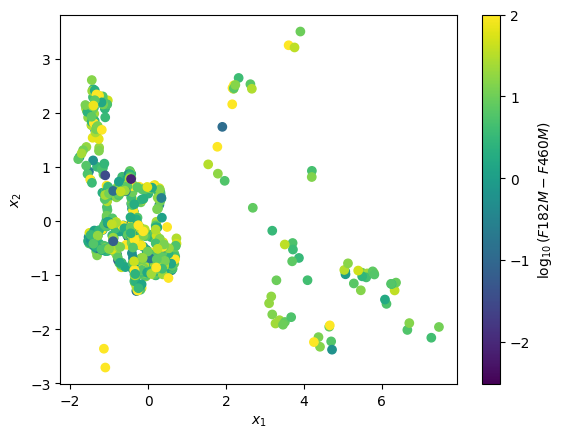

F182M_KRON F480M_KRON


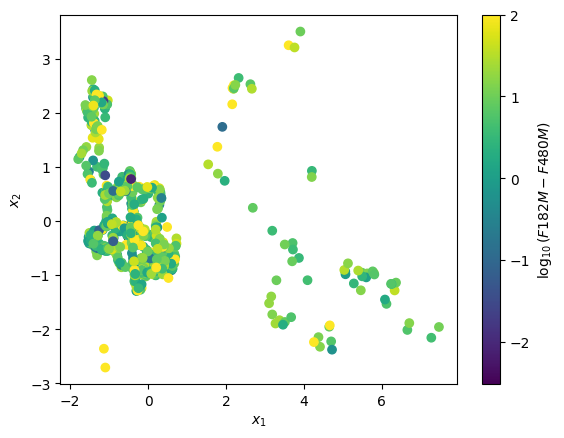

F182M_KRON F435W_KRON


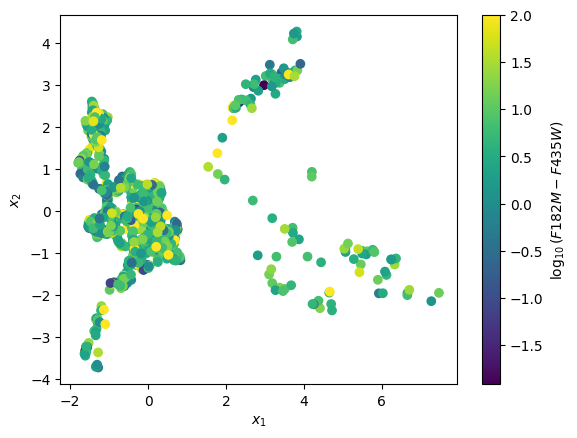

F182M_KRON F606W_KRON


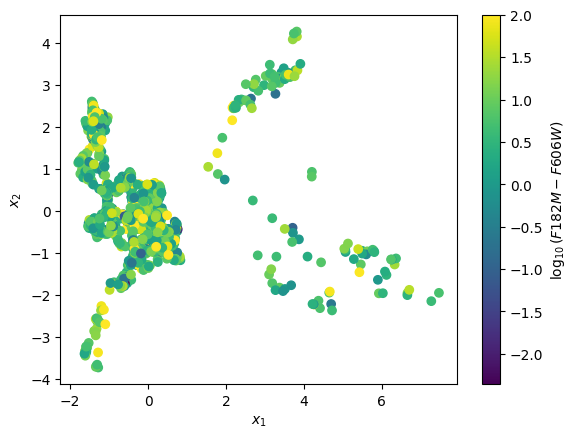

F182M_KRON F775W_KRON


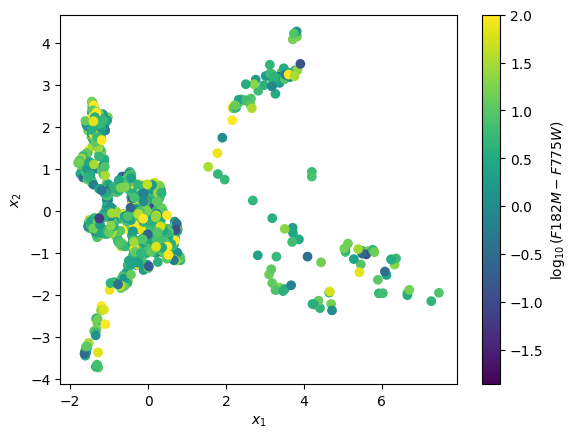

F182M_KRON F814W_KRON


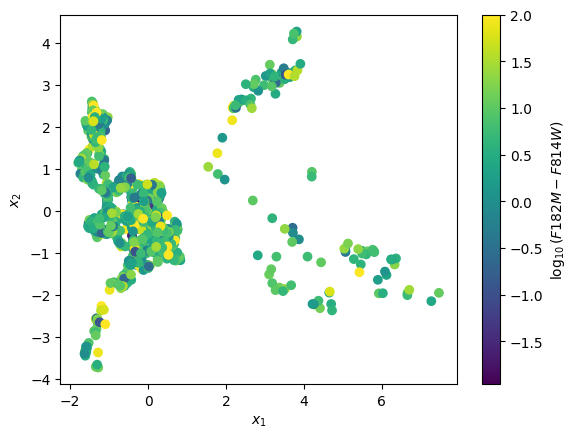

F182M_KRON F850LP_KRON


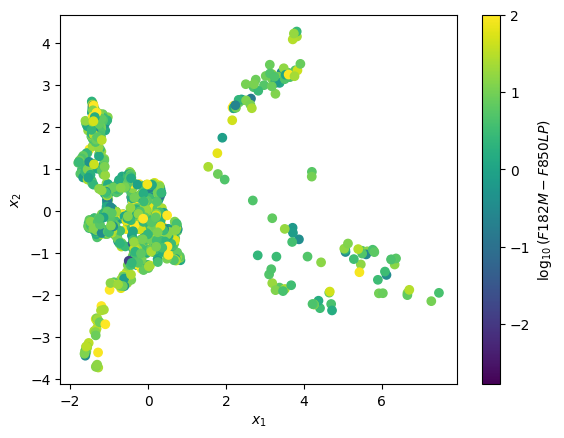

F182M_KRON F105W_KRON


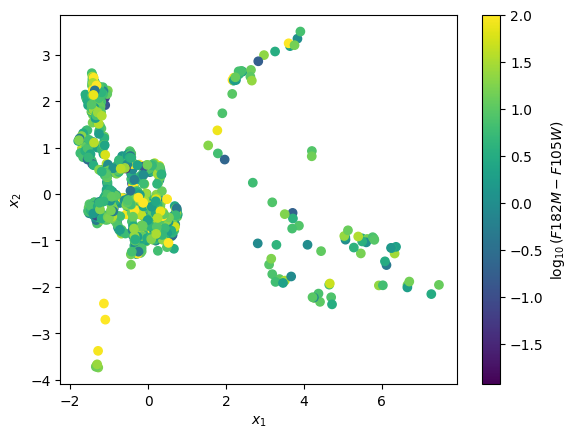

F182M_KRON F125W_KRON


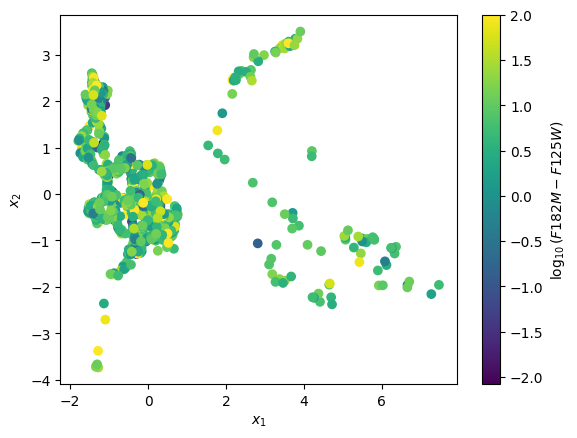

F182M_KRON F140W_KRON


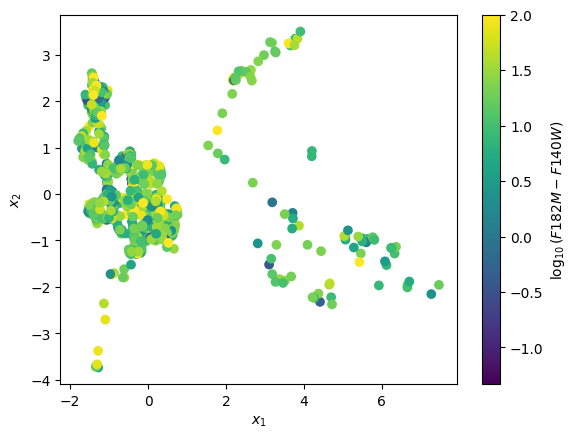

F182M_KRON F160W_KRON


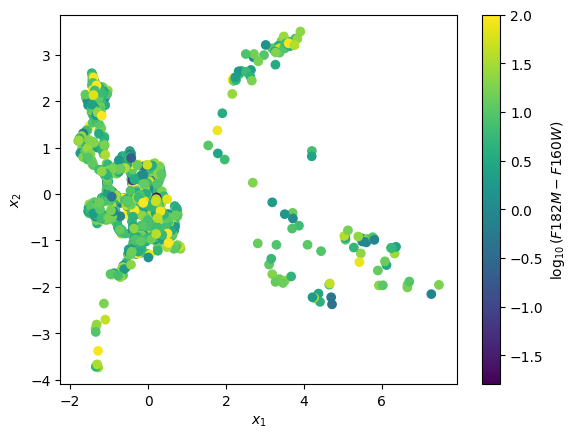

F200W_KRON F090W_KRON


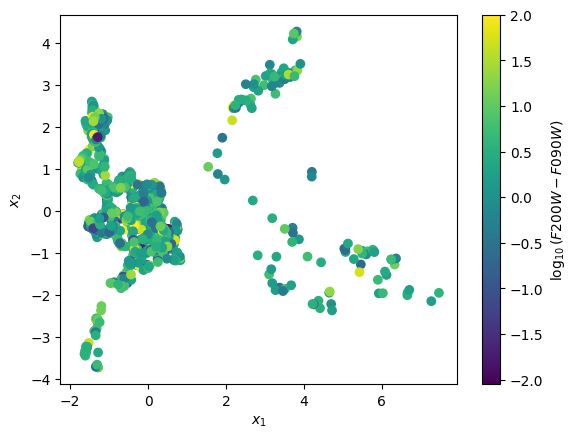

F200W_KRON F115W_KRON


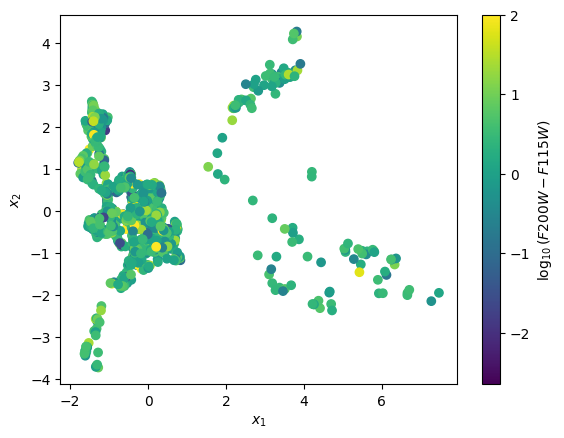

F200W_KRON F150W_KRON


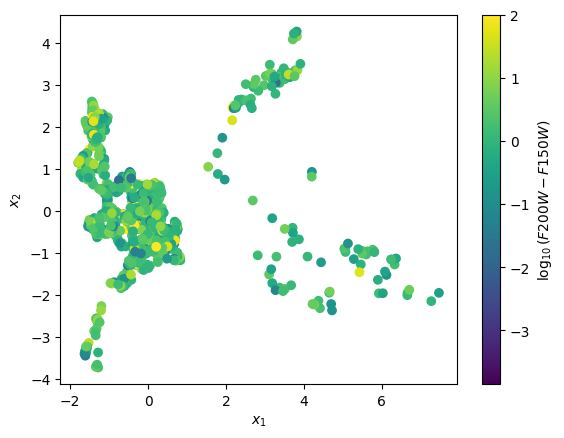

F200W_KRON F182M_KRON


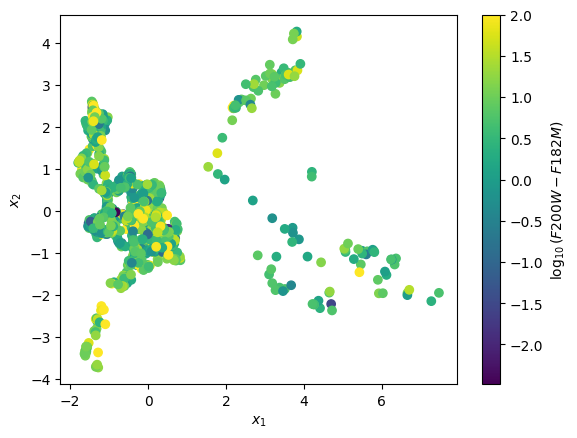

F200W_KRON F200W_KRON
F200W_KRON F210M_KRON


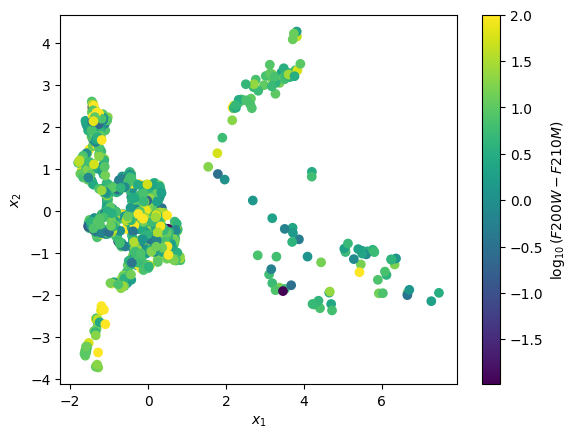

F200W_KRON F277W_KRON


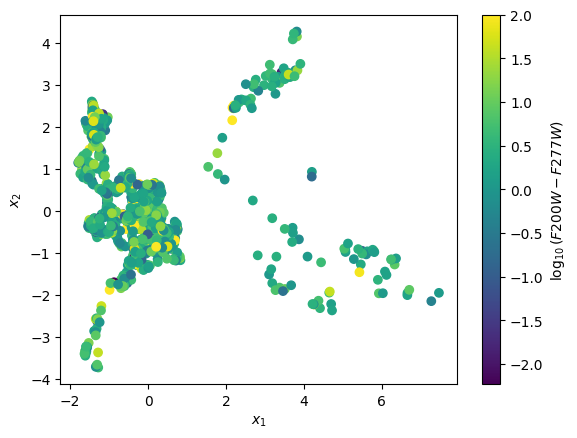

F200W_KRON F335M_KRON


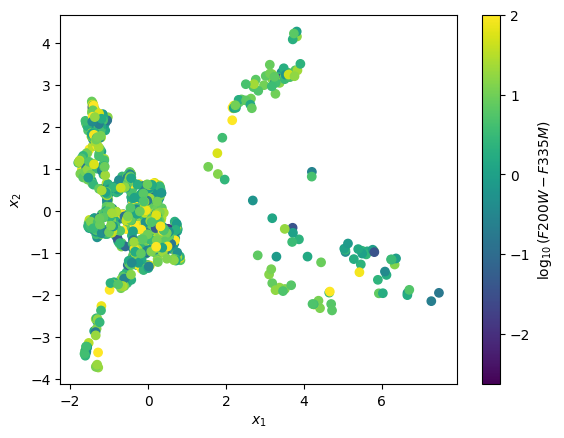

F200W_KRON F356W_KRON


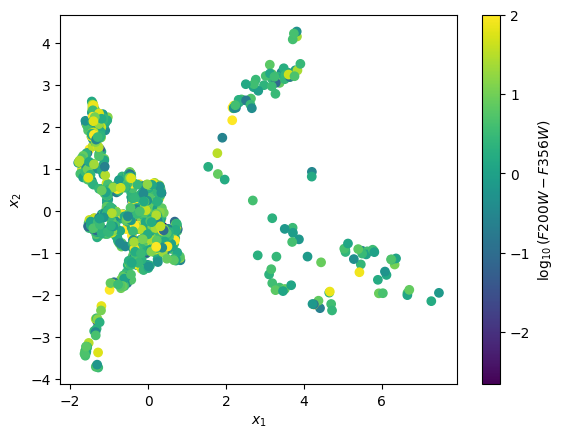

F200W_KRON F410M_KRON


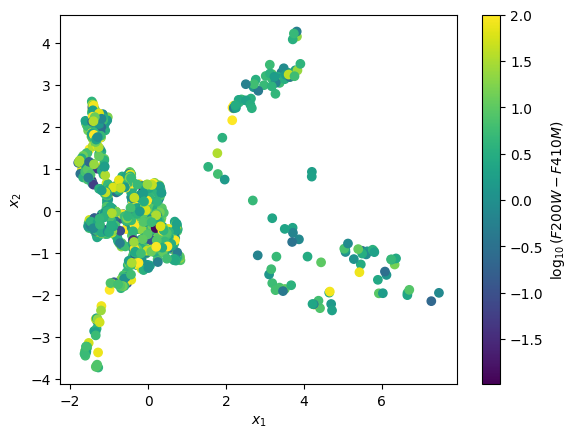

F200W_KRON F430M_KRON


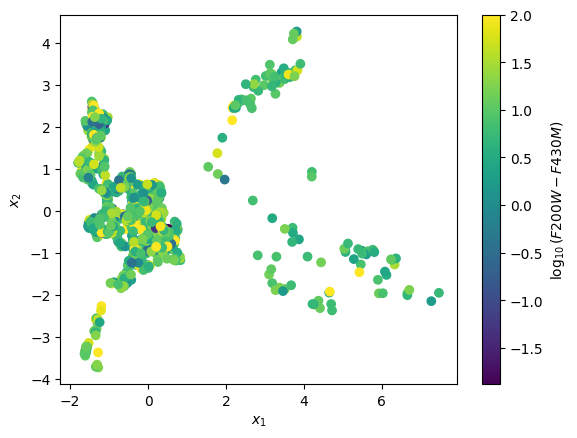

F200W_KRON F444W_KRON


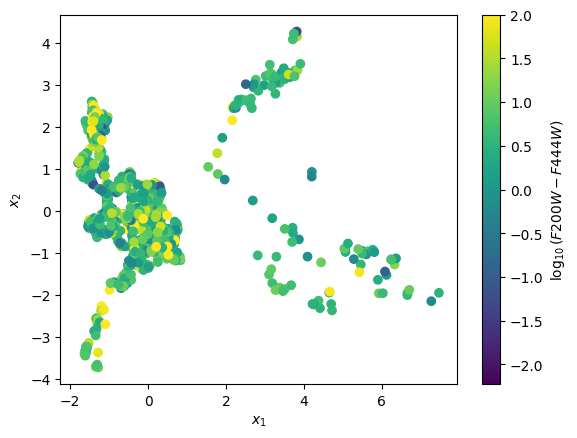

F200W_KRON F460M_KRON


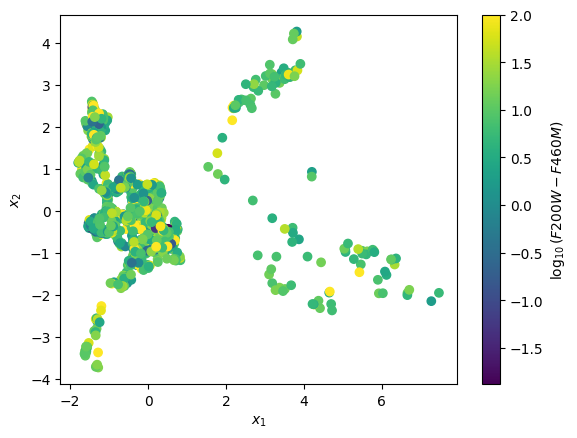

F200W_KRON F480M_KRON


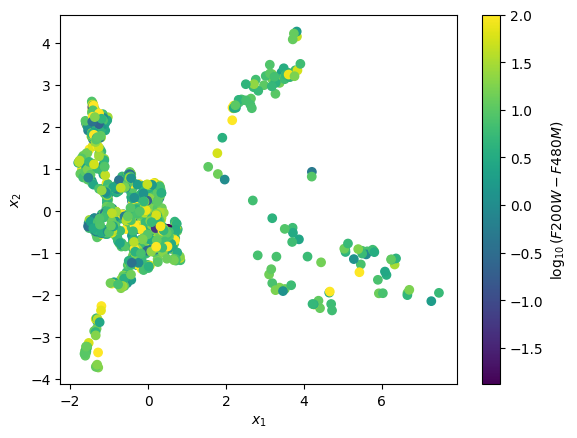

F200W_KRON F435W_KRON


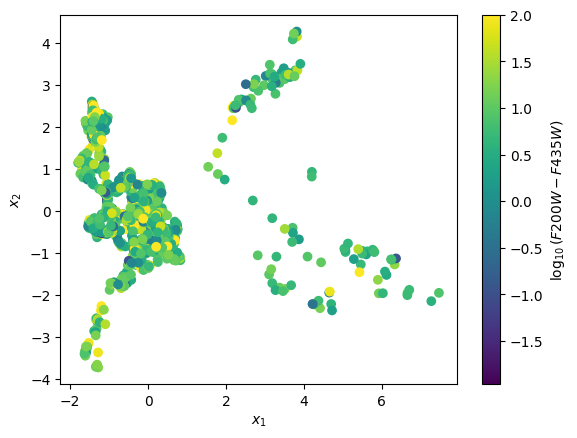

F200W_KRON F606W_KRON


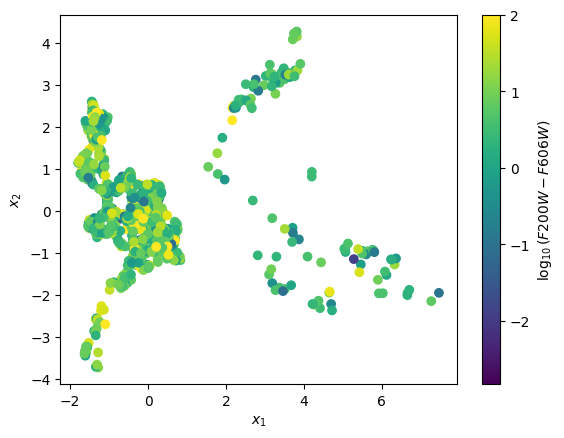

F200W_KRON F775W_KRON


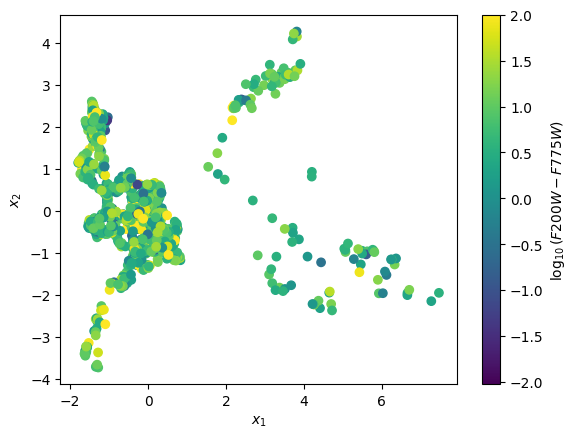

F200W_KRON F814W_KRON


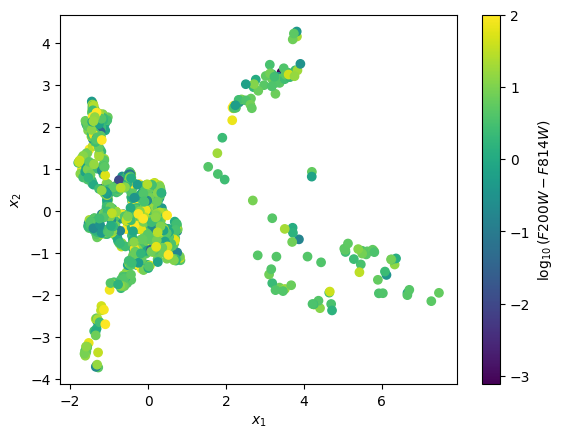

F200W_KRON F850LP_KRON


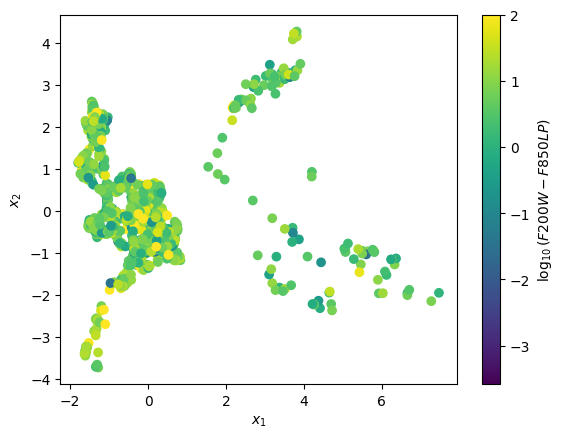

F200W_KRON F105W_KRON


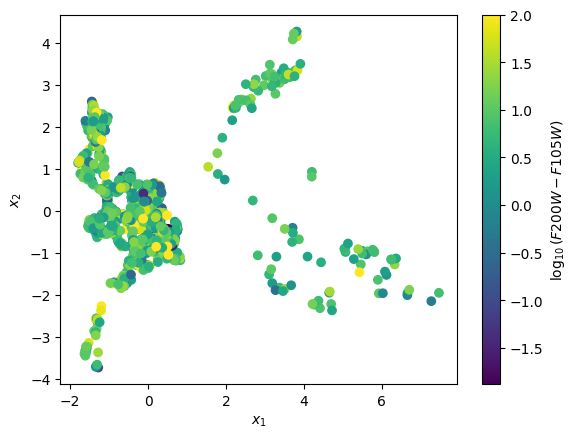

F200W_KRON F125W_KRON


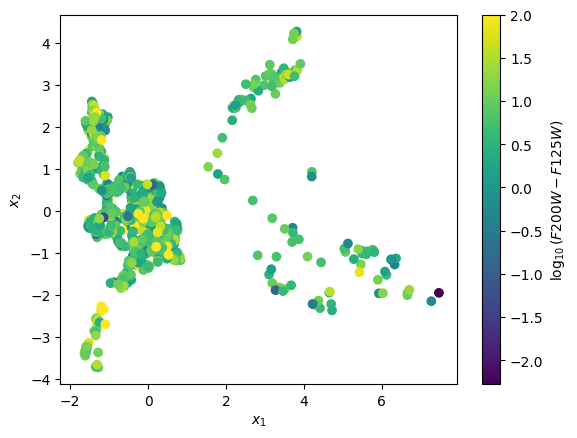

F200W_KRON F140W_KRON


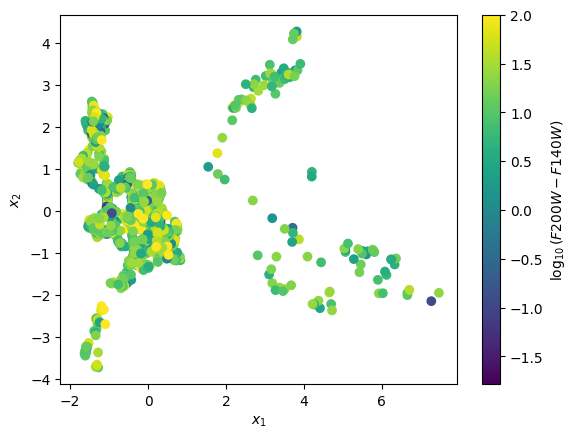

F200W_KRON F160W_KRON


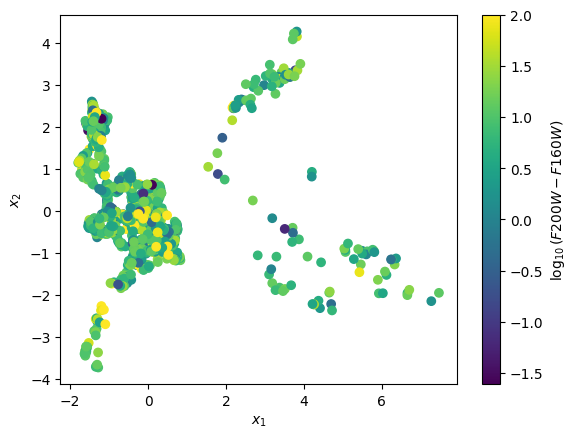

F210M_KRON F090W_KRON


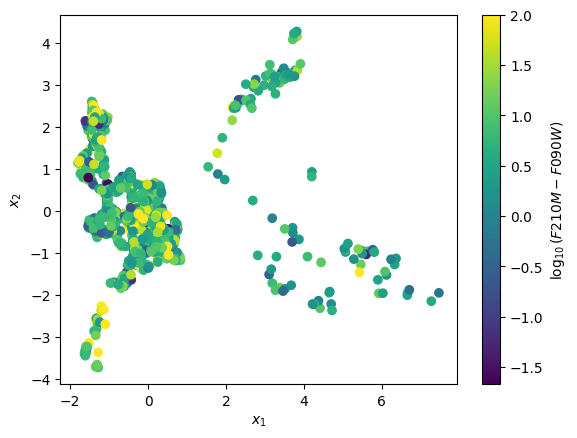

F210M_KRON F115W_KRON


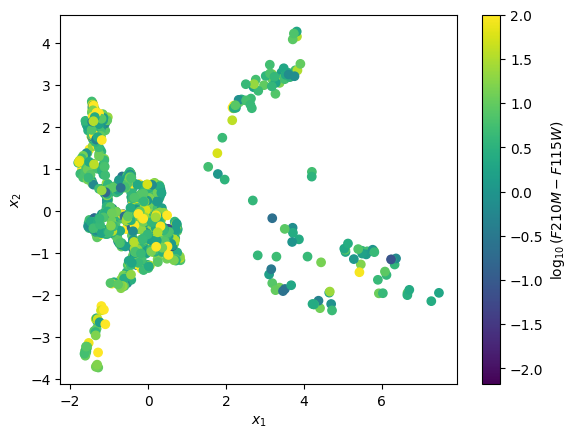

F210M_KRON F150W_KRON


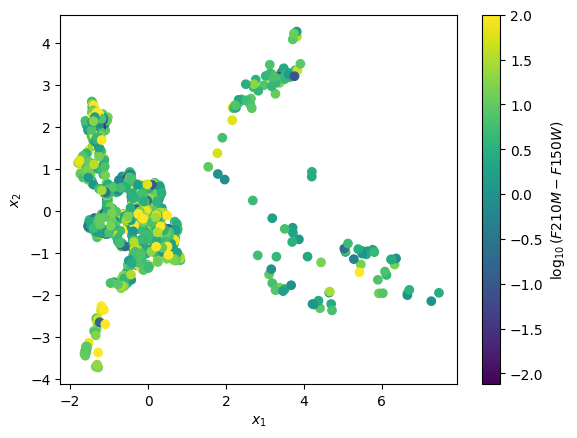

F210M_KRON F182M_KRON


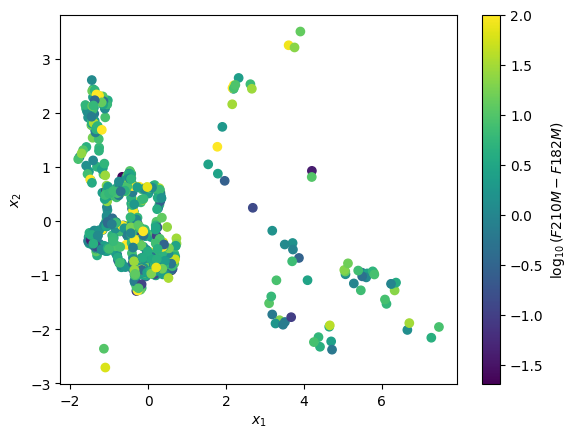

F210M_KRON F200W_KRON


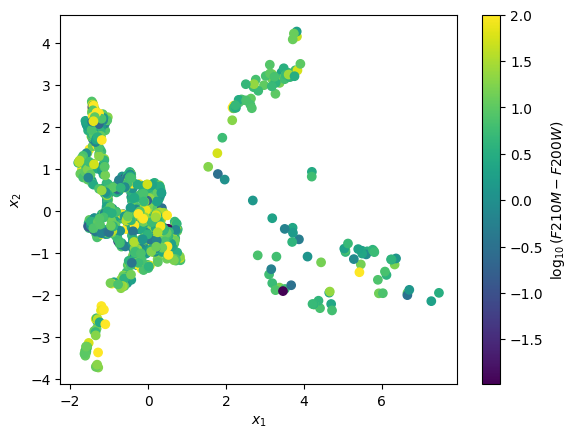

F210M_KRON F210M_KRON
F210M_KRON F277W_KRON


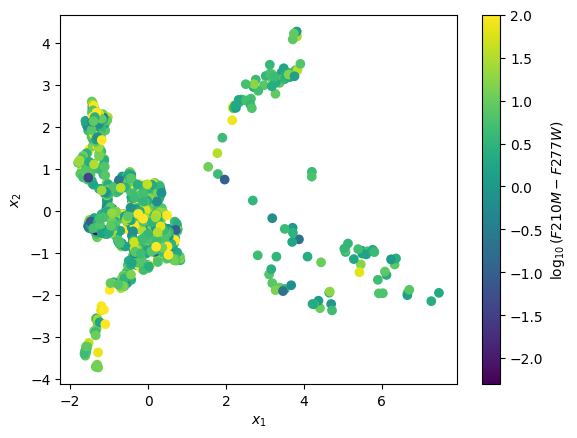

F210M_KRON F335M_KRON


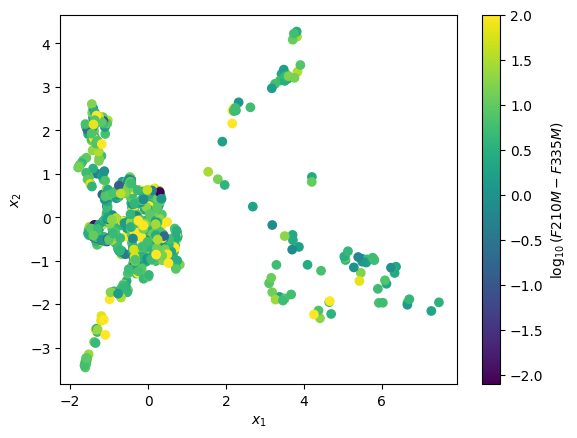

F210M_KRON F356W_KRON


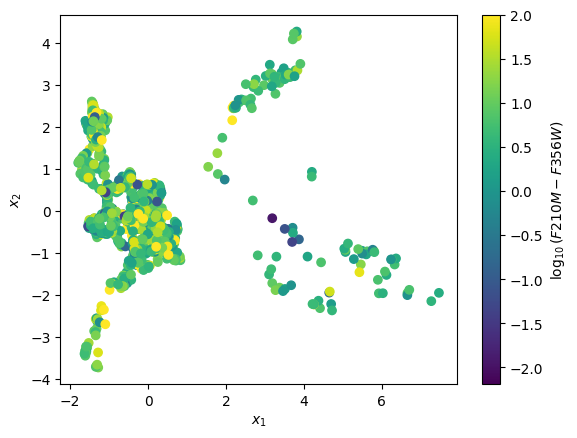

F210M_KRON F410M_KRON


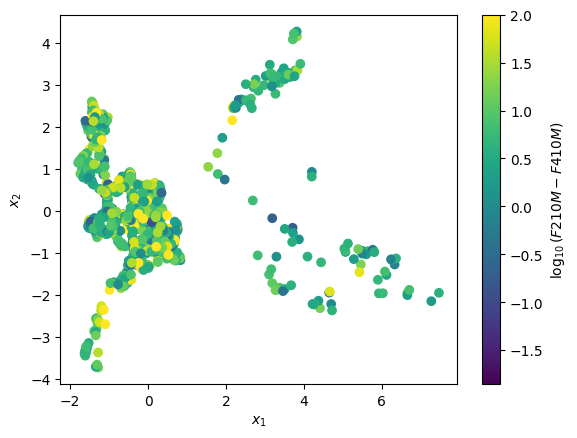

F210M_KRON F430M_KRON


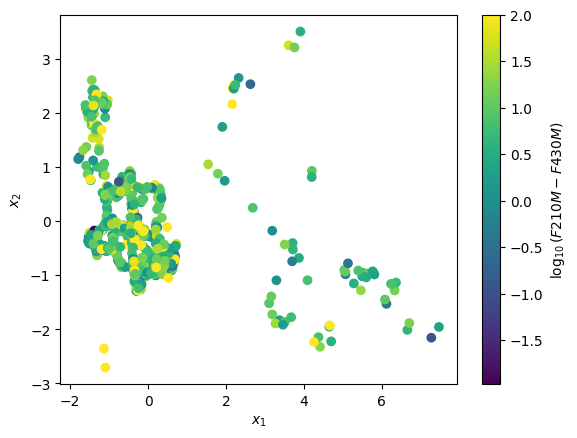

F210M_KRON F444W_KRON


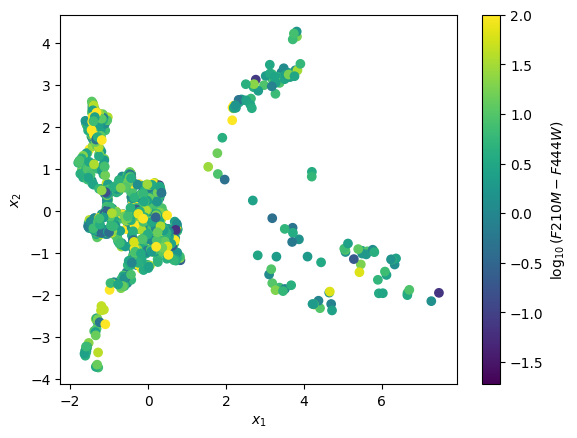

F210M_KRON F460M_KRON


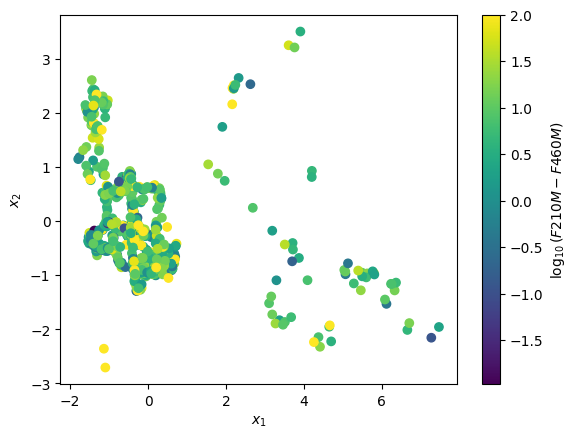

F210M_KRON F480M_KRON


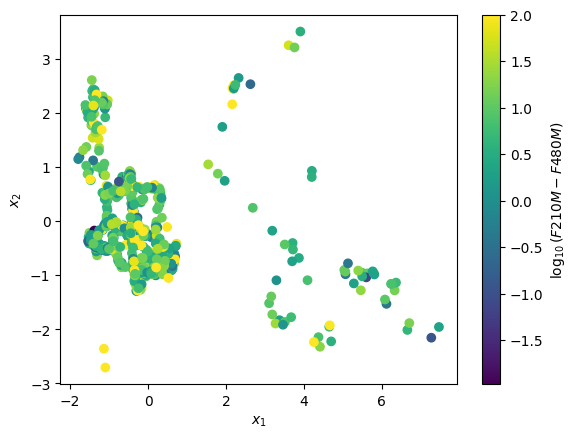

F210M_KRON F435W_KRON


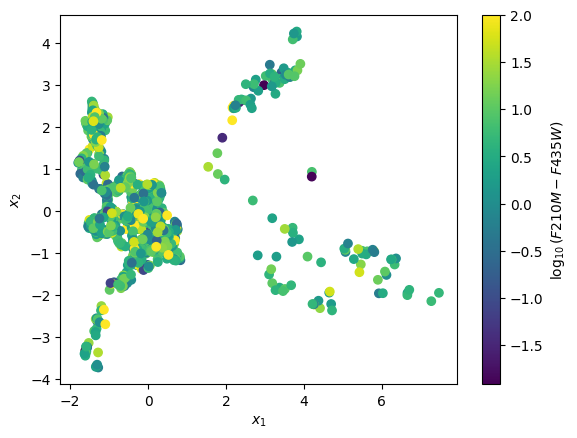

F210M_KRON F606W_KRON


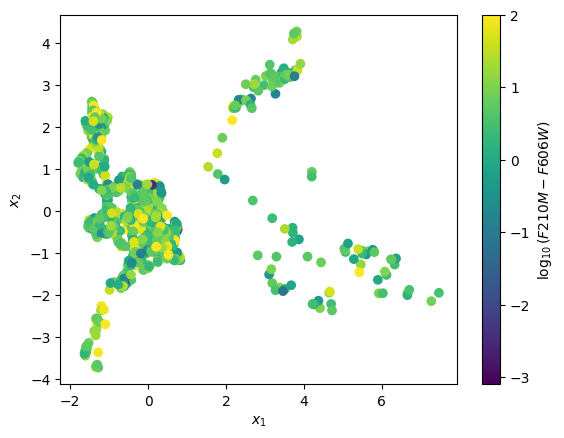

F210M_KRON F775W_KRON


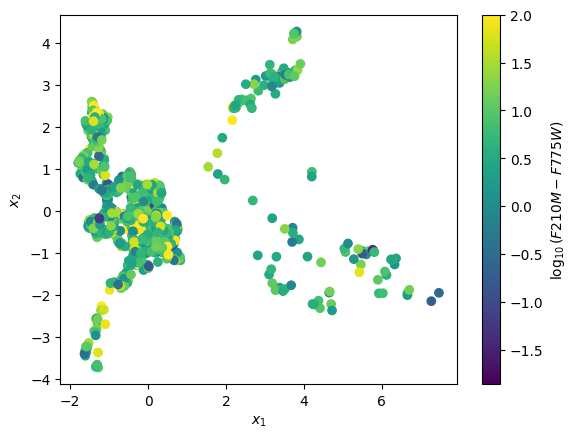

F210M_KRON F814W_KRON


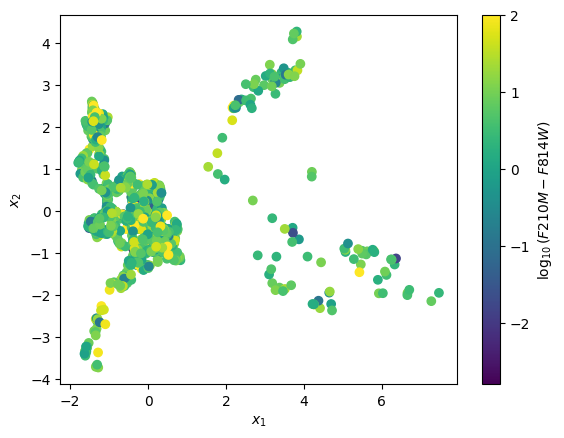

F210M_KRON F850LP_KRON


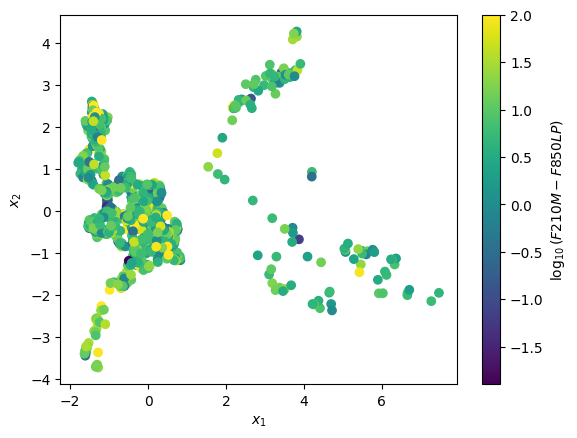

F210M_KRON F105W_KRON


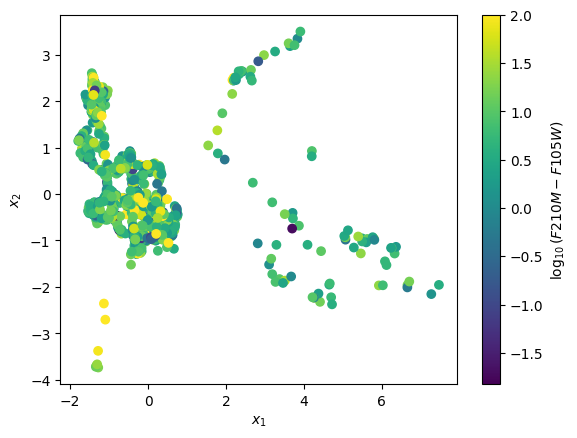

F210M_KRON F125W_KRON


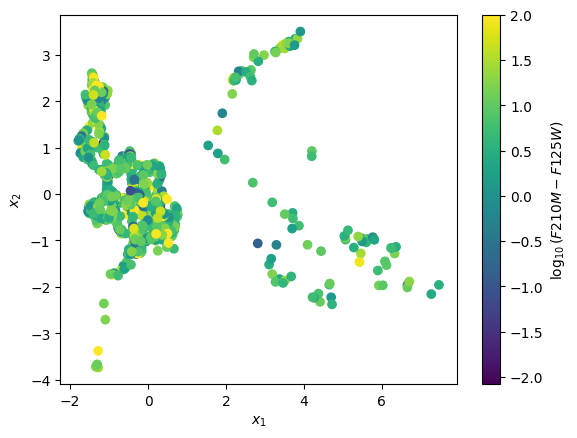

F210M_KRON F140W_KRON


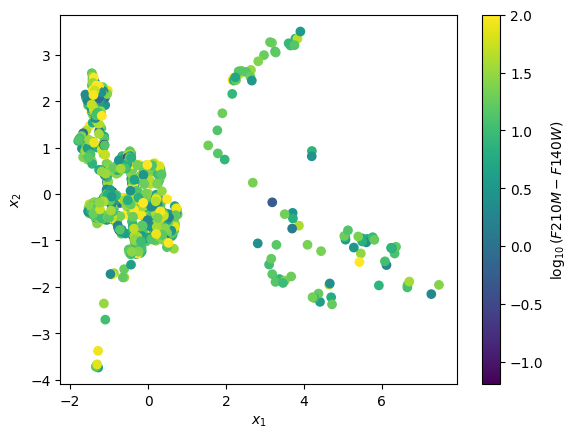

F210M_KRON F160W_KRON


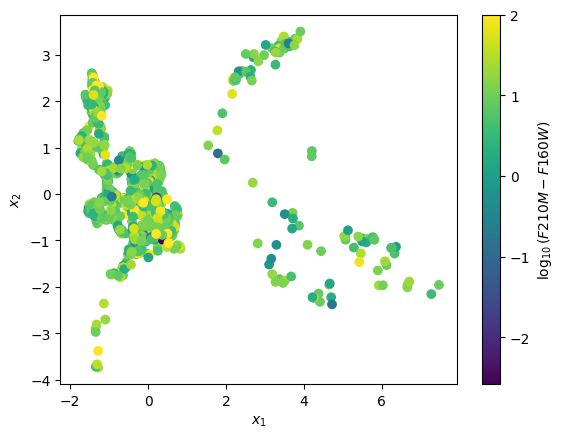

F277W_KRON F090W_KRON


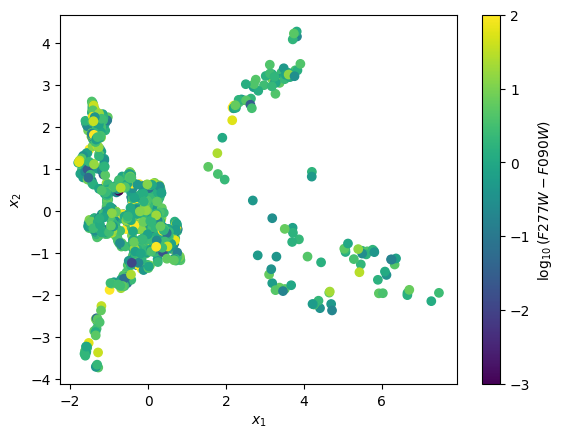

F277W_KRON F115W_KRON


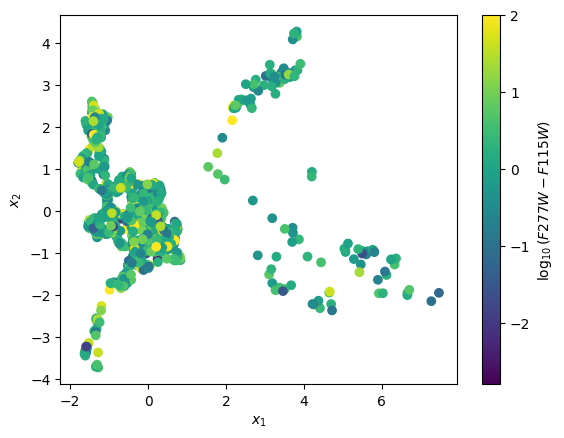

F277W_KRON F150W_KRON


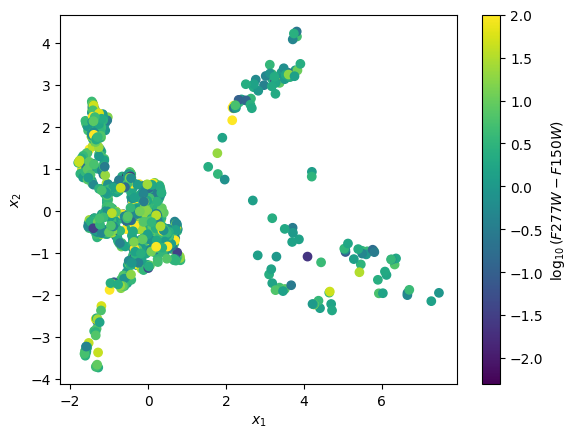

F277W_KRON F182M_KRON


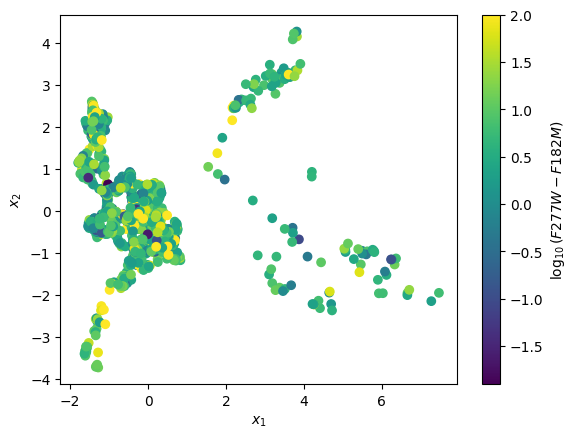

F277W_KRON F200W_KRON


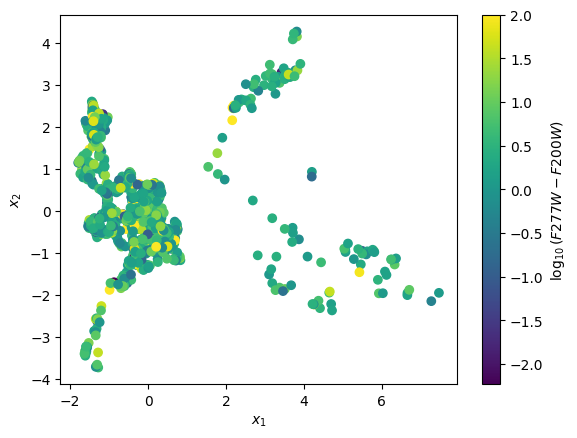

F277W_KRON F210M_KRON


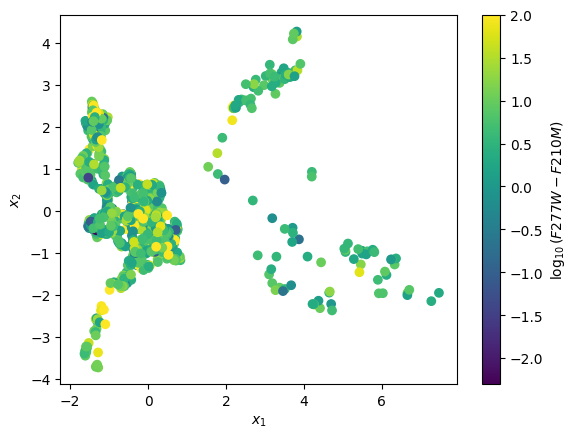

F277W_KRON F277W_KRON
F277W_KRON F335M_KRON


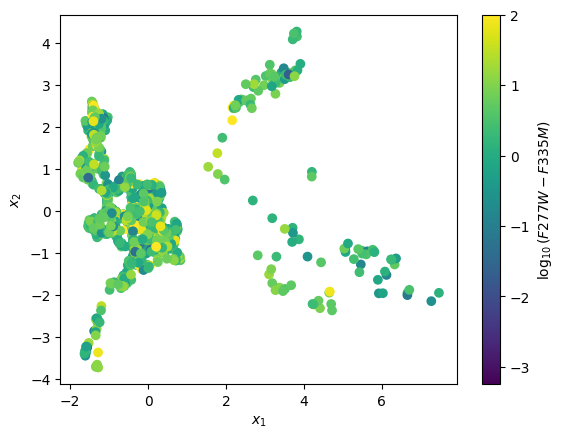

F277W_KRON F356W_KRON


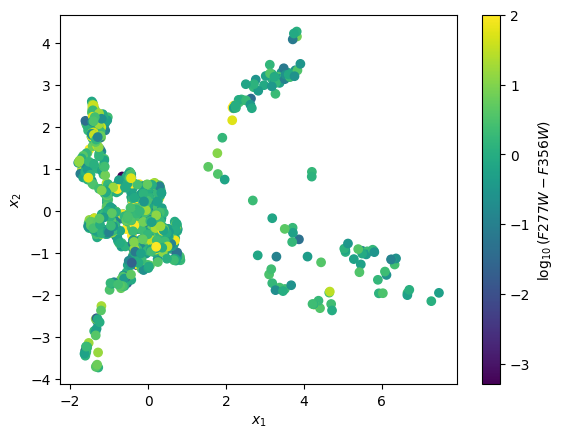

F277W_KRON F410M_KRON


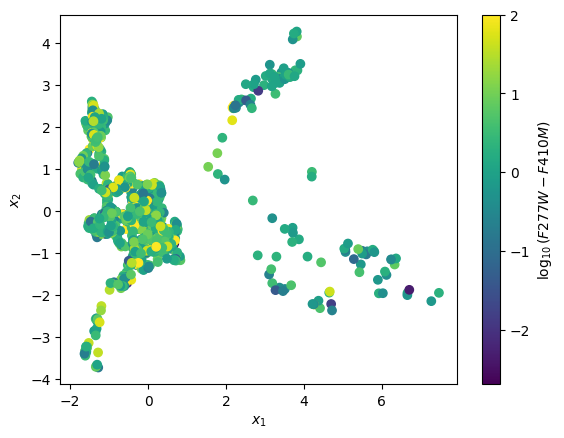

F277W_KRON F430M_KRON


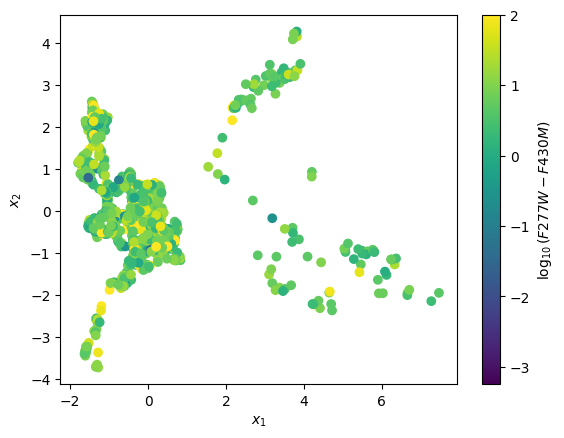

F277W_KRON F444W_KRON


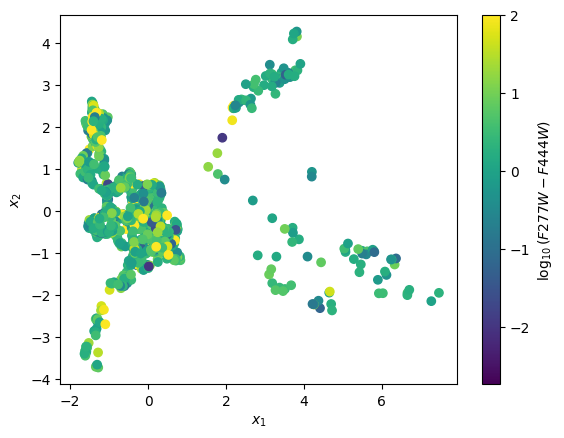

F277W_KRON F460M_KRON


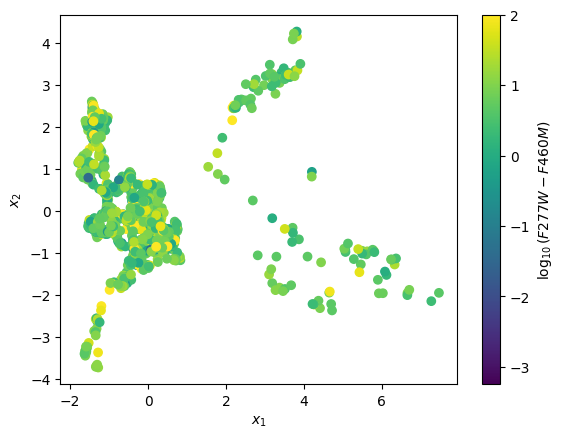

F277W_KRON F480M_KRON


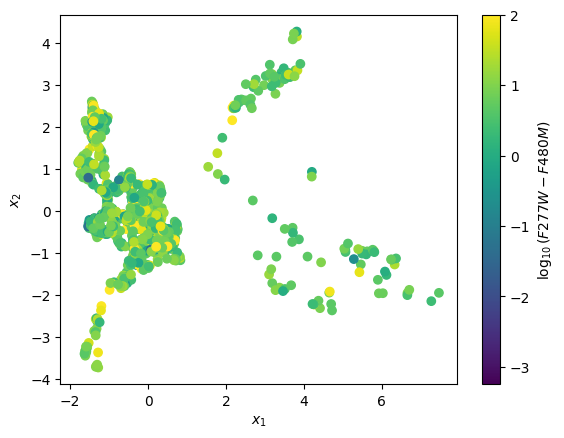

F277W_KRON F435W_KRON


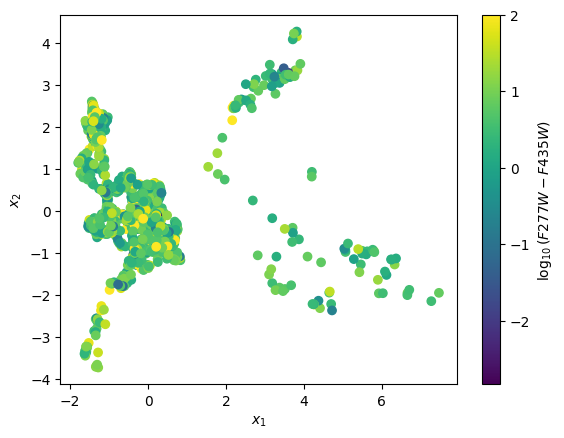

F277W_KRON F606W_KRON


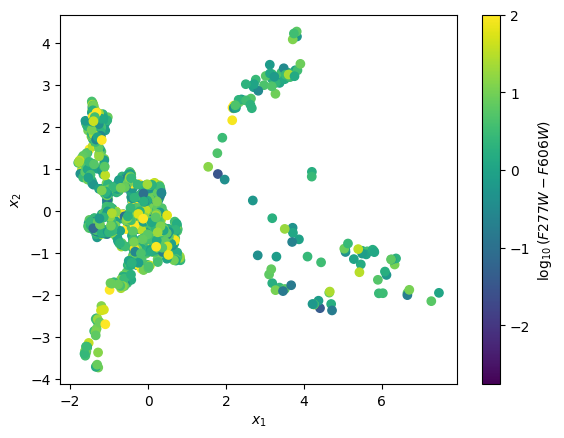

F277W_KRON F775W_KRON


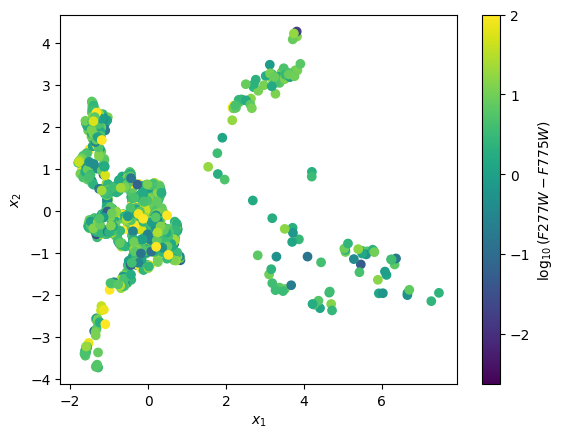

F277W_KRON F814W_KRON


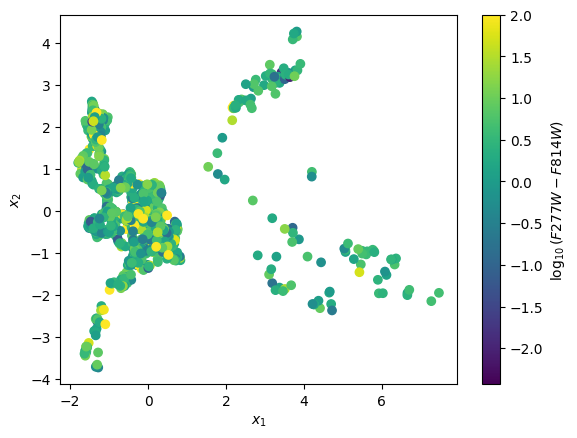

F277W_KRON F850LP_KRON


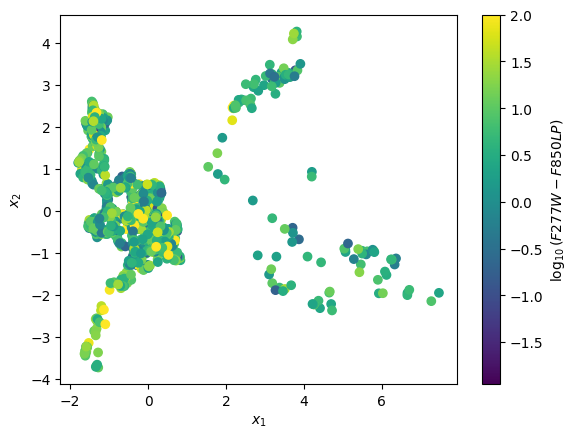

F277W_KRON F105W_KRON


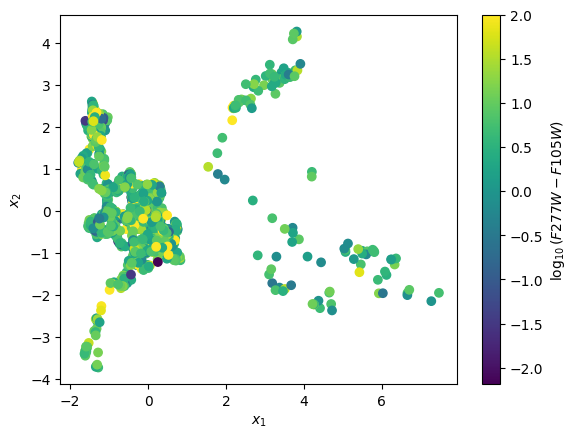

F277W_KRON F125W_KRON


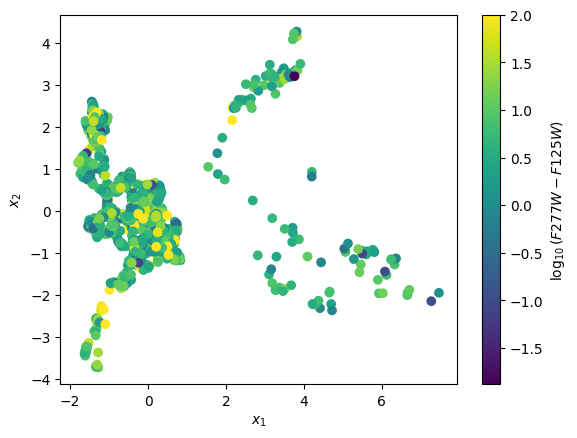

F277W_KRON F140W_KRON


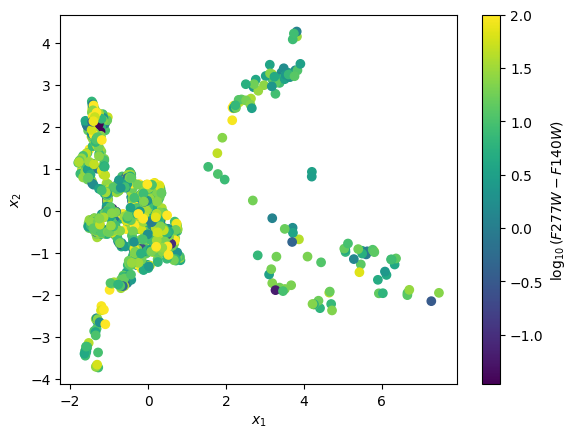

F277W_KRON F160W_KRON


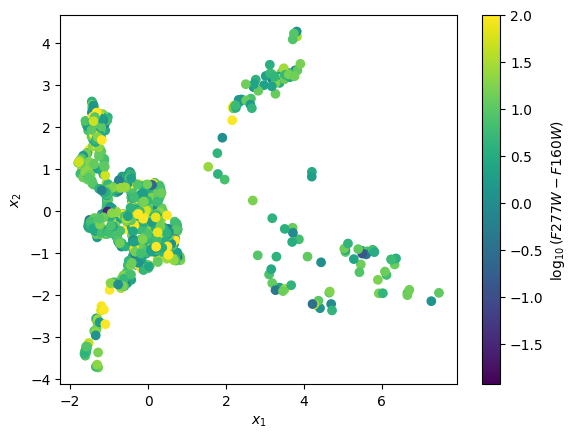

F335M_KRON F090W_KRON


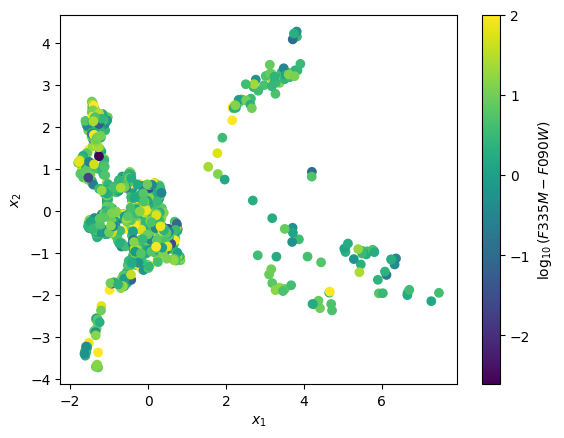

F335M_KRON F115W_KRON


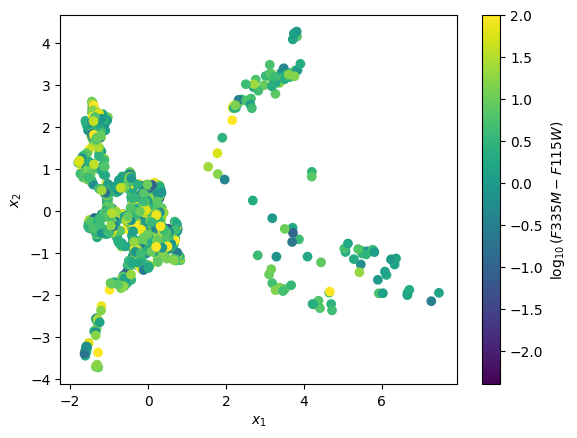

F335M_KRON F150W_KRON


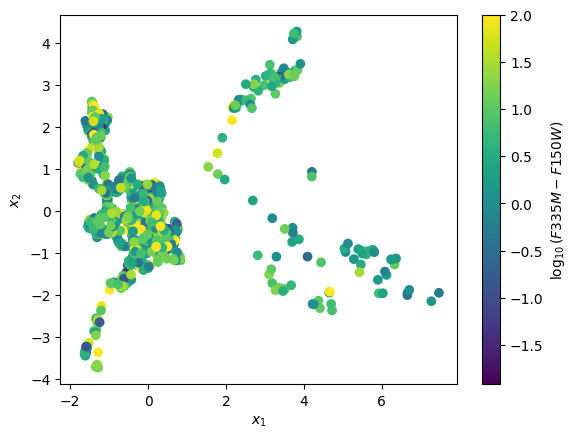

F335M_KRON F182M_KRON


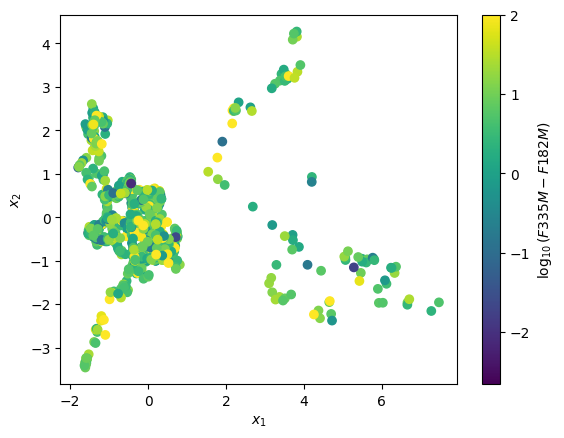

F335M_KRON F200W_KRON


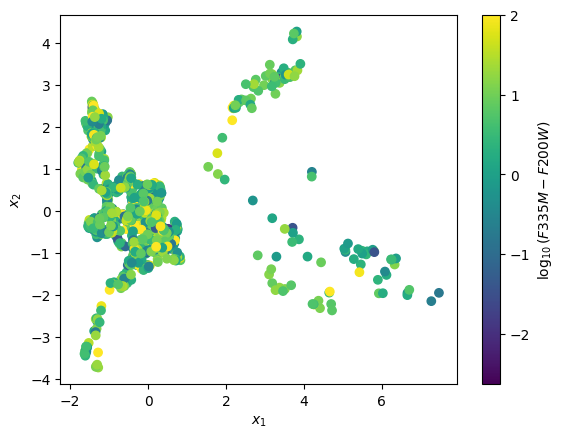

F335M_KRON F210M_KRON


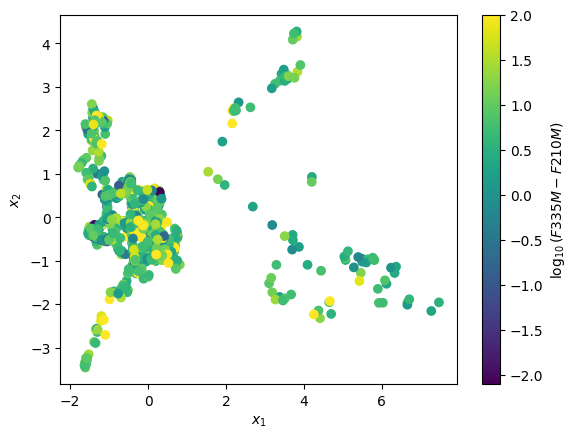

F335M_KRON F277W_KRON


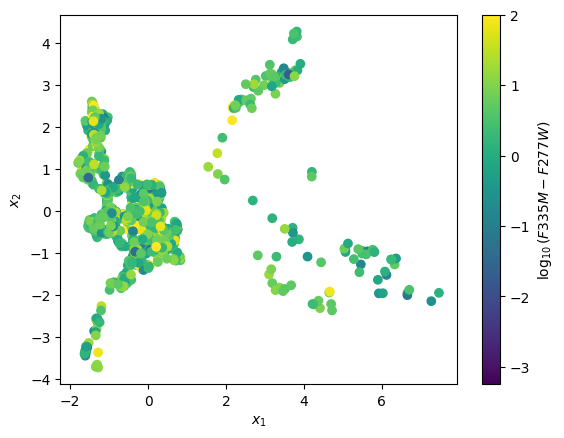

F335M_KRON F335M_KRON
F335M_KRON F356W_KRON


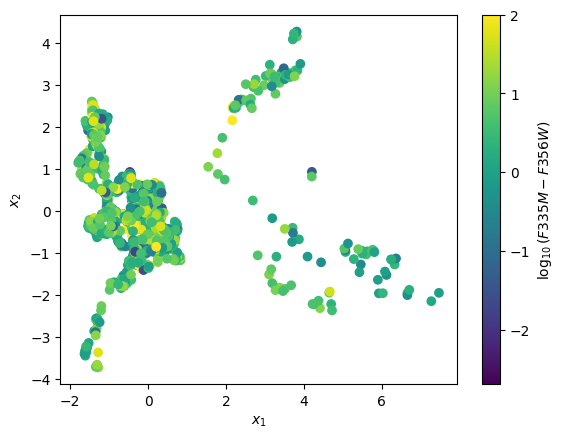

F335M_KRON F410M_KRON


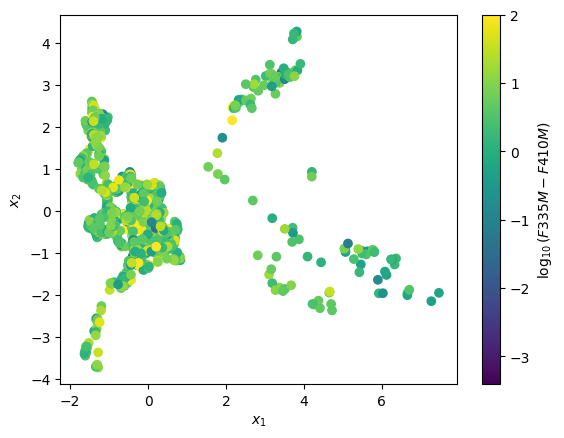

F335M_KRON F430M_KRON


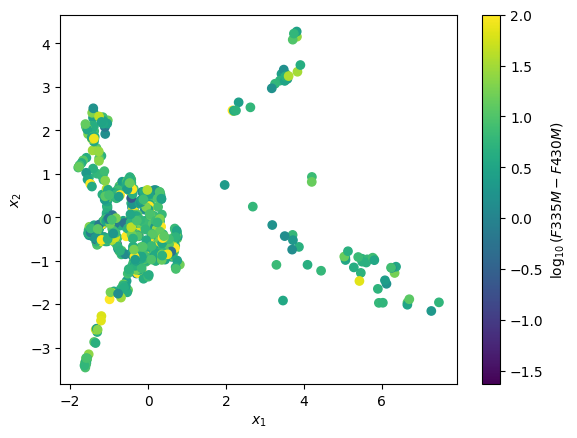

F335M_KRON F444W_KRON


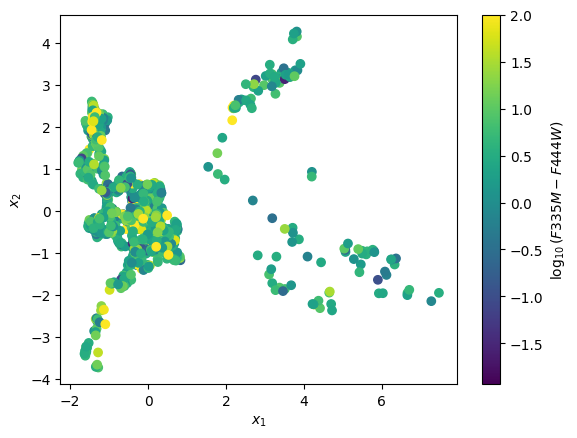

F335M_KRON F460M_KRON


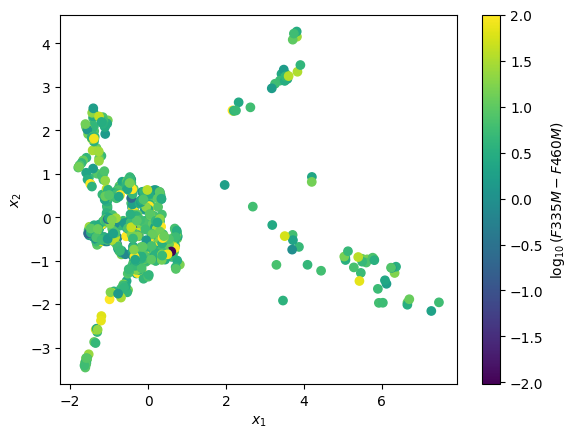

F335M_KRON F480M_KRON


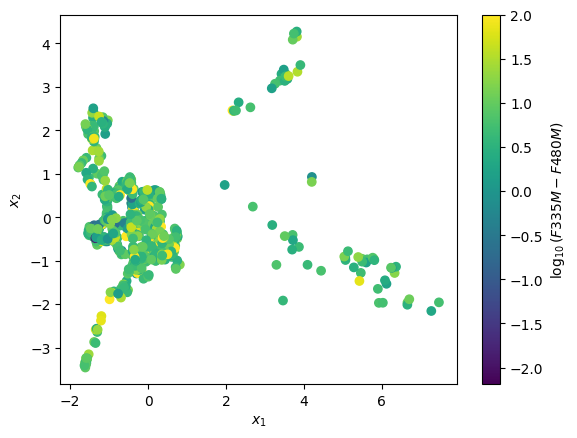

F335M_KRON F435W_KRON


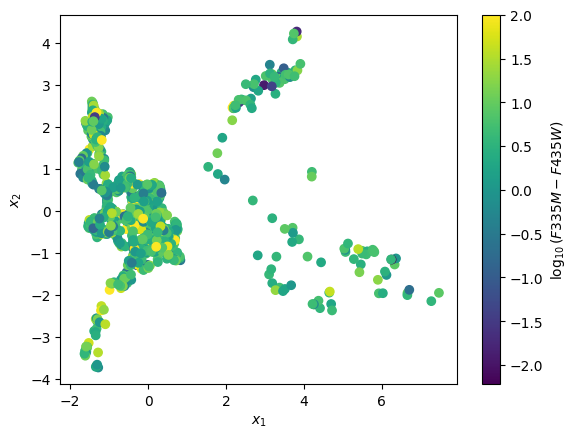

F335M_KRON F606W_KRON


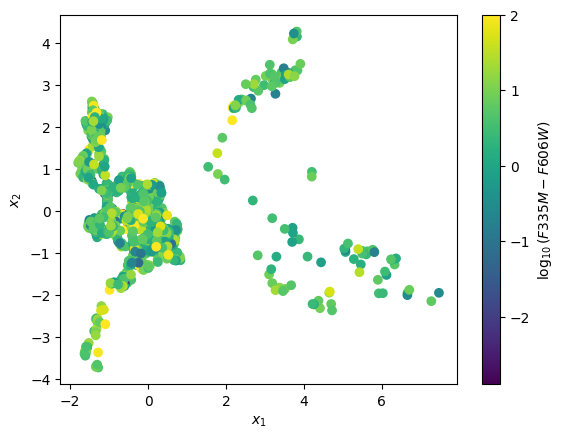

F335M_KRON F775W_KRON


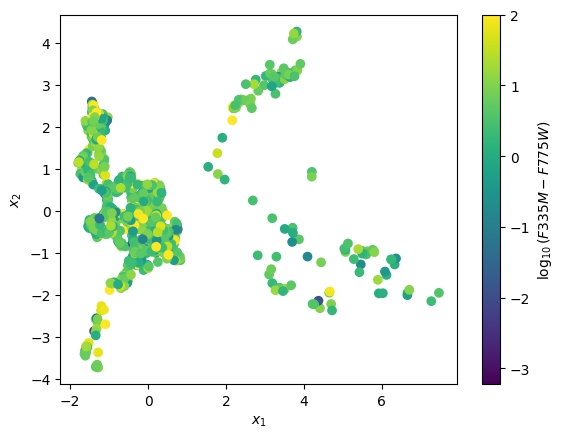

F335M_KRON F814W_KRON


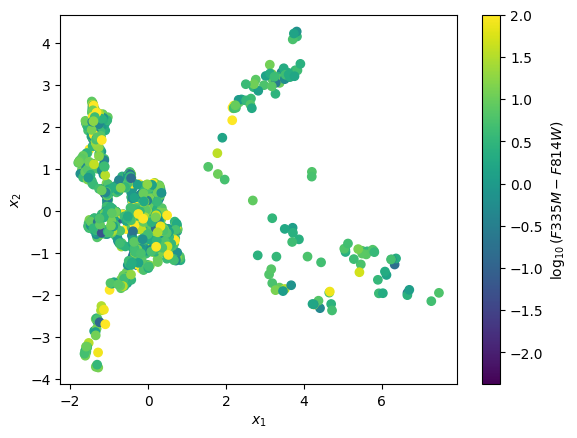

F335M_KRON F850LP_KRON


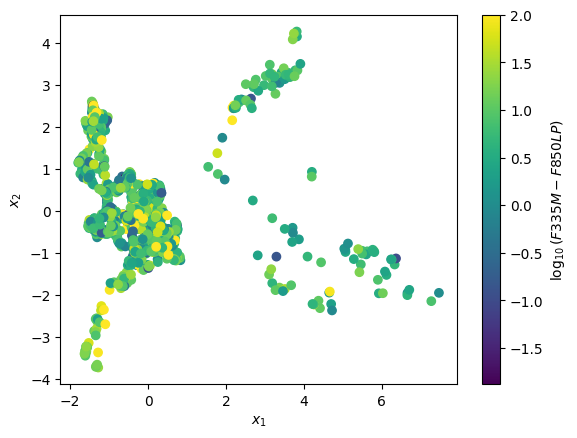

F335M_KRON F105W_KRON


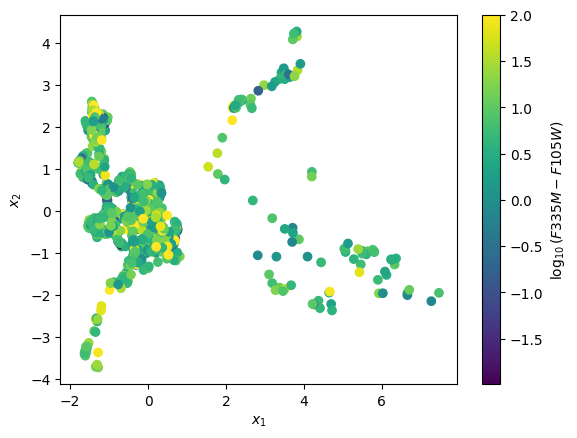

F335M_KRON F125W_KRON


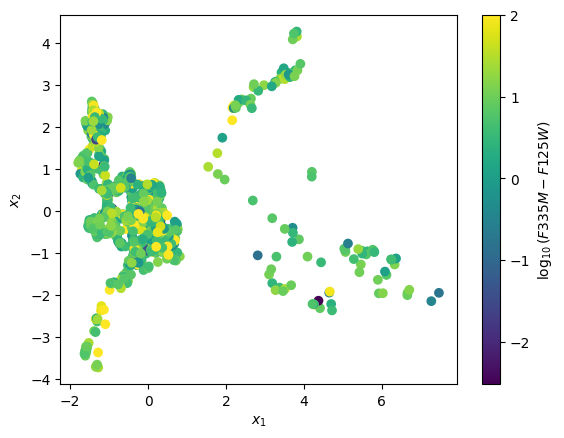

F335M_KRON F140W_KRON


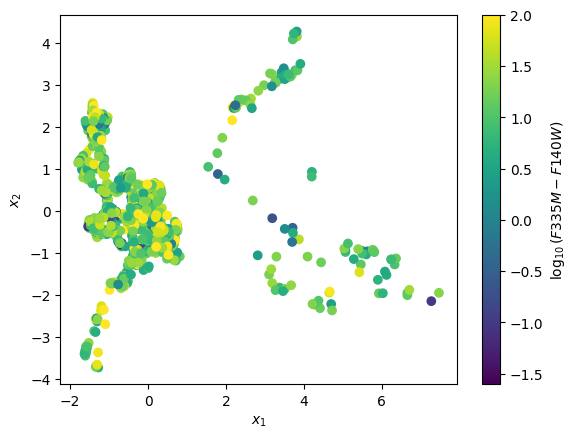

F335M_KRON F160W_KRON


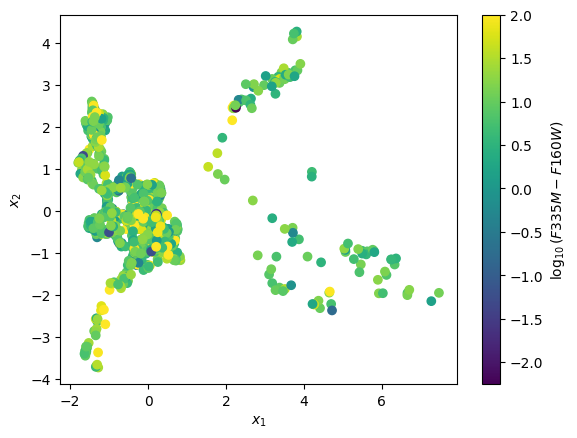

F356W_KRON F090W_KRON


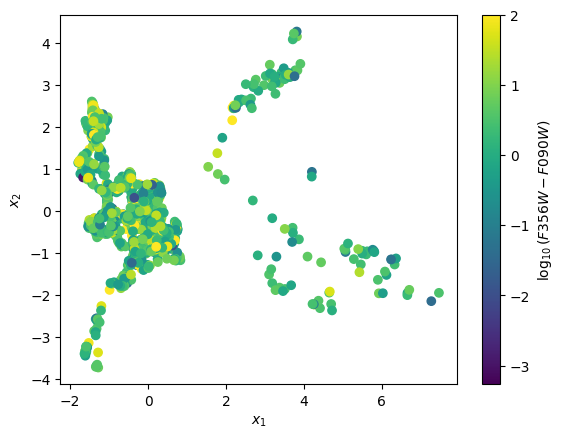

F356W_KRON F115W_KRON


In [ ]:
for filt in filters:
    for other_filt in filters:
        print(filt, other_filt)
        try:
            plot_color_by(filt, other_filt, log=True, vmax=2)
        except:
            plot_color_by(filt, other_filt, vmax=100)

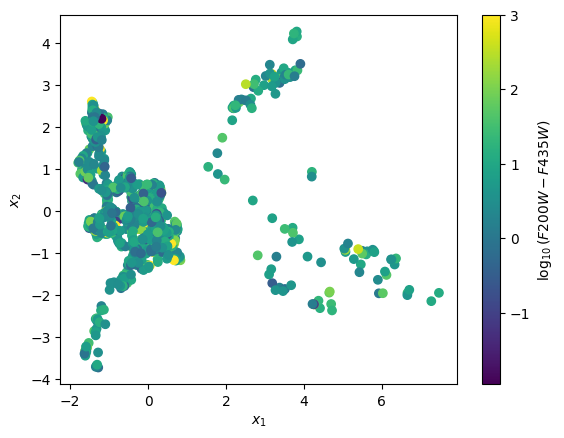

In [322]:
plot_color_by('F200W_KRON', 'F435W_KRON', vmax=3, log=True)

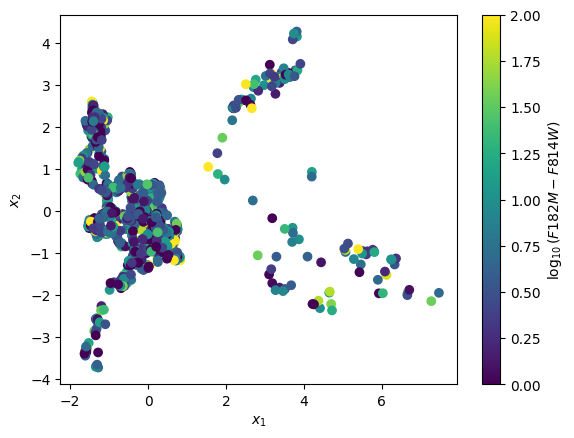

In [323]:
fig = plot_color_by('F182M_KRON', 'F814W_KRON', log=True, vmin=0, vmax=2, ret=True)
# fig.savefig("figures/colored_embedding_1000.pdf")

/var/folders/0r/_1bnthz146q2xj0c42f4nl_80000gq/T/ipykernel_39908/3301325122.py:16: RuntimeWarning:

divide by zero encountered in log10



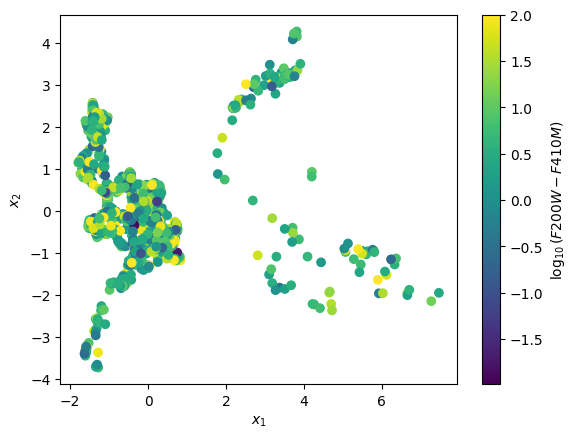

In [324]:
plot_color_by('F200W_KRON', 'F410M_KRON', log=True, vmax=2)

/var/folders/0r/_1bnthz146q2xj0c42f4nl_80000gq/T/ipykernel_39908/3301325122.py:16: RuntimeWarning:

divide by zero encountered in log10



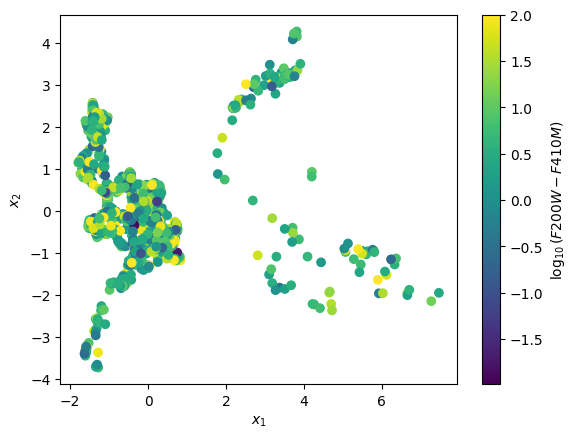

In [325]:
fig = plot_color_by('F200W_KRON', 'F410M_KRON', log=True, vmax=2)
# fig.savefig("figures/colored_embedding.pdf", bbox_inches='tight')

In [330]:
def get_data_from_filter(key):
    thing_to_color_by = data[7].data[key][~np.isnan(all_zs)][close_mask]
    # thing_to_color_by = np.delete(thing_to_color_by, disconnected_nodes)
    return thing_to_color_by

/var/folders/0r/_1bnthz146q2xj0c42f4nl_80000gq/T/ipykernel_39908/2300370312.py:1: RuntimeWarning:

divide by zero encountered in log10



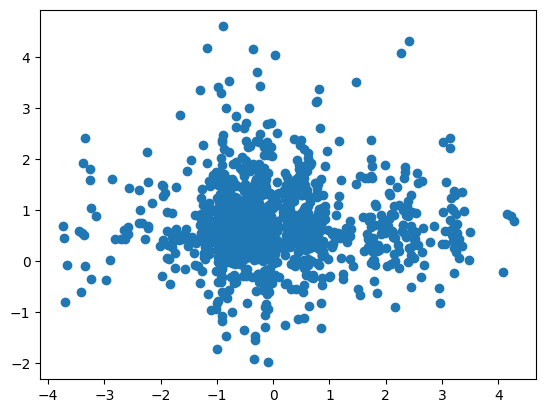

In [331]:
plt.plot(x2, np.log10(abs(get_data_from_filter('F200W_KRON') - get_data_from_filter('F410M_KRON'))), 'o')

In [335]:
def check_correlations(data, cutoff = 0.5):
    things_to_check = [x1, x2, np.sqrt(x1**2 + x2**2), x3]
    for i, thing in enumerate(things_to_check):
        coeff = np.corrcoef(data, thing)[0][1]
        if abs(coeff) > cutoff:
            return (coeff, i, 'linear')
        log_coeff = np.corrcoef(np.log10(data), thing)[0][1]
        if abs(log_coeff) > cutoff:
            return (coeff, i, 'log')
        loglog_coeff = np.corrcoef(np.log10(data), np.log10(thing))[0][1]
        if abs(loglog_coeff) > cutoff:
            return (coeff, i, 'loglog')
    return None
    


In [336]:
for filt in filters:
    filter_data = get_data_from_filter(filt)
    coeff_tuple = check_correlations(filter_data, cutoff=0.01)
    if coeff_tuple is not None:
        print(filt, *coeff_tuple)
    for other_filt in filters:
        other_filter_data = get_data_from_filter(filt)
        coeff_tuple = check_correlations(filter_data - other_filter_data, cutoff=0.01)
        if coeff_tuple is not None:
            print(filt, *coeff_tuple)
    #     print(filt, other_filt)
    #     try:
    #         plot_color_by(filt, other_filt, log=True, vmax=2)
    #     except:
    #         plot_color_by(filt, other_filt, vmax=100)

F090W_KRON -0.023964851062016502 0 linear
F115W_KRON -0.024230866330181015 0 linear
F150W_KRON -0.022005240512998712 0 linear
F182M_KRON -0.03278161832275424 0 linear
F200W_KRON -0.021903580514140823 0 linear
F210M_KRON -0.032404613717033404 0 linear
F277W_KRON -0.024977802770887698 0 linear
F335M_KRON -0.024248225226922545 1 linear


/var/folders/0r/_1bnthz146q2xj0c42f4nl_80000gq/T/ipykernel_39908/2387540886.py:7: RuntimeWarning:

divide by zero encountered in log10

/var/folders/0r/_1bnthz146q2xj0c42f4nl_80000gq/T/ipykernel_39908/2387540886.py:10: RuntimeWarning:

divide by zero encountered in log10

/var/folders/0r/_1bnthz146q2xj0c42f4nl_80000gq/T/ipykernel_39908/2387540886.py:10: RuntimeWarning:

invalid value encountered in log10

/var/folders/0r/_1bnthz146q2xj0c42f4nl_80000gq/T/ipykernel_39908/2387540886.py:7: RuntimeWarning:

invalid value encountered in log10



F356W_KRON -0.010727270227204254 0 linear
F410M_KRON -0.02213115881333506 0 linear
F430M_KRON -0.01433242926054978 1 linear
F444W_KRON -0.03426677245493384 0 linear
F460M_KRON -0.01392776494950303 1 linear
F480M_KRON -0.014195428990660978 1 linear
F435W_KRON -0.03110990209560951 0 linear
F606W_KRON -0.03493815337764553 0 linear
F775W_KRON -0.03346615640163281 0 linear
F814W_KRON -0.03162271560964701 0 linear
F850LP_KRON -0.03292665007005415 0 linear
F105W_KRON -0.03498522414574567 0 linear
F125W_KRON -0.034840842697129386 0 linear
F140W_KRON -0.034433531511217 0 linear
F160W_KRON -0.03459121694612987 0 linear
